<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"></ul></div>

In [ ]:
#!conda install geopandas
#!conda install geopy

#!pip install geopandas
#!#pip install geopy

In [1]:
# load libraries
%matplotlib inline
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import geopandas as gpd
import cartopy.crs as ccrs
import mapclassify   # 2.3.0
import seaborn as sns

%config InlineBackend.figure_format = 'retina'


In [2]:
world = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"))
print("Geometry Column Name : ", world.geometry.name)
print("Dataset Size : ", world.shape)
world.head()

Geometry Column Name :  geometry
Dataset Size :  (177, 6)


,pop_est,continent,name,iso_a3,gdp_md_est,geometry
0,920938,Oceania,Fiji,FJI,8374.0,"MULTIPOLYGON (((180.00000 -16.06713, 180.00000..."
1,53950935,Africa,Tanzania,TZA,150600.0,"POLYGON ((33.90371 -0.95000, 34.07262 -1.05982..."
2,603253,Africa,W. Sahara,ESH,906.5,"POLYGON ((-8.66559 27.65643, -8.66512 27.58948..."
3,35623680,North America,Canada,CAN,1674000.0,"MULTIPOLYGON (((-122.84000 49.00000, -122.9742..."
4,326625791,North America,United States of America,USA,18560000.0,"MULTIPOLYGON (((-122.84000 49.00000, -120.0000..."


In [3]:
# Define data directory
shapedir='/Users/maartenk/Documents/git/Cookbooks/Sources/ShapeFiles/'

In [4]:
# read files
file = 'gemeente_2021_v1.shp' 
fp = shapedir+file
# or
# fp = f'{shapedir}BAG-Woonplaatsgrenzen.shp'
#or
fp_ = shapedir+'nl_imergis_kustlijn_2018.shp'
fp__ = shapedir+'ESRI-PC4-2017R1.shp'

# create geopandas
map_df_woonplaats = gpd.read_file(fp)
map_df_kustlijn = gpd.read_file(fp_)
map_df_pc4 = gpd.read_file(fp__)

In [5]:
WoonKernen = shapedir+'Top10NL-Plaats_kern.shp'

map_df_woonkernen = gpd.read_file(WoonKernen)

In [6]:
provincies = shapedir+'2019_provinciegrenzen_watergrenzen.gpkg'

map_df_provincies = gpd.read_file(provincies)

/Users/maartenk/opt/anaconda3/lib/python3.7/site-packages/geopandas/geodataframe.py:422: RuntimeWarning: Sequential read of iterator was interrupted. Resetting iterator. This can negatively impact the performance.
  for feature in features_lst:


In [7]:
roads = shapedir+'nwb-light.shp'

map_df_roads = gpd.read_file(roads)

In [8]:
rail = shapedir+'Top10NL_Spoorwegen.shp'

map_df_rail = gpd.read_file(rail)

In [9]:
# get the communal boundaries
# gemeenten = shapedir+'2019_gemeentegrenzen_kustlijn.gpkg'

map_df = gpd.read_file('/Users/maartenk/Downloads/WijkBuurtkaart_2021_v1/gemeente_2021_v1.shp')


In [10]:
#correct for boundary changes

df_purmerend = map_df.loc[map_df['GM_NAAM'].isin(['Beemster', 'Purmerend'])].copy()

df_purmerend.loc[:,('GM_CODE', 'GM_NAAM')] = ['GM0439','Purmerend'].copy()

df_purmerend = df_purmerend.dissolve(by=['GM_CODE', 'GM_NAAM'], aggfunc='sum')

df_purmerend = df_purmerend.reset_index()

# map_df = map_df.append(df_purmerend)

df_purmerend


,GM_CODE,GM_NAAM,geometry,OAD,STED,BEV_DICHTH,AANT_INW,AANT_MAN,AANT_VROUW,P_00_14_JR,...,P_ANT_ARU,P_SURINAM,P_TURKIJE,P_OVER_NW,OPP_TOT,OPP_LAND,OPP_WATER,JAAR,Shape_Leng,Shape_Area
0,GM0439,Purmerend,"POLYGON ((127710.726 503923.014, 127763.833 50...",2919,6,3671,91793,44874,46919,31,...,0,6,2,13,9663,9373,290,4042,62247.490296,9.662702e+07


In [11]:
#correct for boundary changes


df_dijk = map_df.loc[map_df['GM_NAAM'].isin(['Heerhugowaard', 'Langedijk'])].copy()

df_dijk[['GM_CODE', 'GM_NAAM']] = ['GM1980', 'Dijk en Waard'].copy()

df_dijk = df_dijk.dissolve(by=['GM_CODE', 'GM_NAAM'], aggfunc='sum')

df_dijk = df_dijk.reset_index()

map_df = map_df.append(df_dijk)




In [38]:
map_df[['GM_NAAM', 'GM_CODE']].loc[map_df['GM_NAAM'].isin(['Dijk en Waard'])]# in ['Appingedam', 'Delfzijl', 'Loppersum' ]]

,GM_NAAM,GM_CODE
0,Dijk en Waard,GM1980


In [12]:
map_df[['GM_NAAM', 'GM_CODE']].loc[map_df['GM_NAAM'].isin(['Landerd', 'Uden'])]# in ['Appingedam', 'Delfzijl', 'Loppersum' ]]

,GM_NAAM,GM_CODE
316,Uden,GM0856
367,Landerd,GM1685


In [13]:
#correct for boundary changes

df_maas = map_df.loc[map_df['GM_NAAM'].isin(['Landerd', 'Uden'])].copy()

df_maas[['GM_CODE', 'GM_NAAM']] = ['GM1991', 'Maashorst'].copy()

df_maas = df_maas.dissolve(by=['GM_CODE', 'GM_NAAM'], aggfunc='sum')

df_maas = df_maas.reset_index()

map_df = map_df.append(df_maas)

In [14]:
map_df[['GM_NAAM', 'GM_CODE']].loc[map_df['GM_NAAM'].isin(['Heerhugowaard', 'Langedijk'])]# in ['Appingedam', 'Delfzijl', 'Loppersum' ]]

,GM_NAAM,GM_CODE
203,Heerhugowaard,GM0398
210,Langedijk,GM0416


In [15]:
#correct for boundary changes

df_cuijk =map_df.loc[map_df['GM_NAAM'].isin(['Boxmeer', 'Cuijk', 
                                   'Grave', 'Mill en Sint Hubert', 
                                   'Sint Anthonis'])].copy()



df_cuijk[['GM_CODE', 'GM_NAAM']] = ['GM1982','Land van Cuijk'].copy()

df_cuijk = df_cuijk.dissolve(by=['GM_CODE', 'GM_NAAM'], aggfunc='sum')

df_cuijk = df_cuijk.reset_index()

map_df = map_df.append(df_cuijk)


In [16]:
map_df.columns

Index(['GM_CODE', 'GM_NAAM', 'H2O', 'OAD', 'STED', 'BEV_DICHTH', 'AANT_INW',
       'AANT_MAN', 'AANT_VROUW', 'P_00_14_JR', 'P_15_24_JR', 'P_25_44_JR',
       'P_45_64_JR', 'P_65_EO_JR', 'P_ONGEHUWD', 'P_GEHUWD', 'P_GESCHEID',
       'P_VERWEDUW', 'AANTAL_HH', 'P_EENP_HH', 'P_HH_Z_K', 'P_HH_M_K',
       'GEM_HH_GR', 'P_WEST_AL', 'P_N_W_AL', 'P_MAROKKO', 'P_ANT_ARU',
       'P_SURINAM', 'P_TURKIJE', 'P_OVER_NW', 'OPP_TOT', 'OPP_LAND',
       'OPP_WATER', 'JRSTATCODE', 'JAAR', 'Shape_Leng', 'Shape_Area',
       'geometry'],
      dtype='object')

In [17]:
import pandas as pd
df = pd.read_csv('/Users/maartenk/Documents/git/CookBooks/Sources/COVID-19_aantallen_gemeente_per_dag_20220202.csv', sep=';')
df.shape

(262632, 12)

In [17]:
url= 'https://data.rivm.nl/covid-19/COVID-19_aantallen_gemeente_per_dag.csv'

df = pd.read_csv(url, sep=';', index_col=0)
df.tail(5)

,Date_of_report,Date_of_publication,Municipality_code,Municipality_name,Province,Security_region_code,Security_region_name,Municipal_health_service,ROAZ_region,Total_reported,Deceased
Version,,,,,,,,,,,
4,2022-03-20 10:00:00,2022-03-20,NaN,NaN,Limburg,VR24,Limburg-Zuid,GGD Zuid-Limburg,Netwerk Acute Zorg Limburg,7,0
4,2022-03-20 10:00:00,2022-03-20,NaN,NaN,Zuid-Holland,VR15,Haaglanden,GGD Haaglanden,Netwerk Acute Zorg West,9,0
4,2022-03-20 10:00:00,2022-03-20,NaN,NaN,Fryslân,VR02,Fryslân,GGD Fryslân,Acute Zorgnetwerk Noord Nederland,3,0
4,2022-03-20 10:00:00,2022-03-20,NaN,NaN,Noord-Holland,VR11,Zaanstreek-Waterland,GGD Zaanstreek/Waterland,NaN,1,0
4,2022-03-20 10:00:00,2022-03-20,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0


In [18]:
df.columns

Index(['Date_of_report', 'Date_of_publication', 'Municipality_code',
       'Municipality_name', 'Province', 'Security_region_code',
       'Security_region_name', 'Municipal_health_service', 'ROAZ_region',
       'Total_reported', 'Deceased'],
      dtype='object')

In [19]:
df = df.dropna(subset=['Municipality_code'])

In [20]:
df['Date_of_publication'].min(), df['Date_of_publication'].max()


('2020-02-28', '2022-03-20')

In [21]:
start = '2022-01-01'
stop = '2022-31-12'

In [22]:
start = df['Date_of_publication'].min()
stop = df['Date_of_publication'].max()

In [23]:
updated = df['Date_of_report'].unique()[0][:10]
updated

'2022-03-20'

In [24]:
groupedGem = df.loc[(df['Date_of_publication'] >= start) &
      (df['Date_of_publication'] <= stop)].groupby('Municipality_code').sum()

In [25]:
map_df_combined = pd.merge(map_df, groupedGem, left_on=map_df['GM_CODE'], 
                           right_on=groupedGem.index.astype(str))

In [26]:
map_df_combined['CovDens']= map_df_combined['Total_reported']/map_df_combined['AANT_INW']

In [27]:
map_df_combined['CovDensPm'] = map_df_combined['CovDens']*1000000

In [28]:
map_df_combined = map_df_combined.loc[map_df_combined['CovDensPm']>0]

In [29]:

map_df_combined['area'] = map_df_combined.geometry.to_crs({'proj':'cea'}).area/1000000 #for hectares

map_df_combined['CovPsqKm'] = map_df_combined['Total_reported']/map_df_combined['area']

# map_df_combined[['CovDensPm', 'cases_per_1' ]]

In [30]:
# pd.Series(map_df_combined['CovDensPm'].loc[map_df_combined['CovDensPm']>0], name=name)

/Users/maartenk/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:45: UserWarning: FixedFormatter should only be used together with FixedLocator


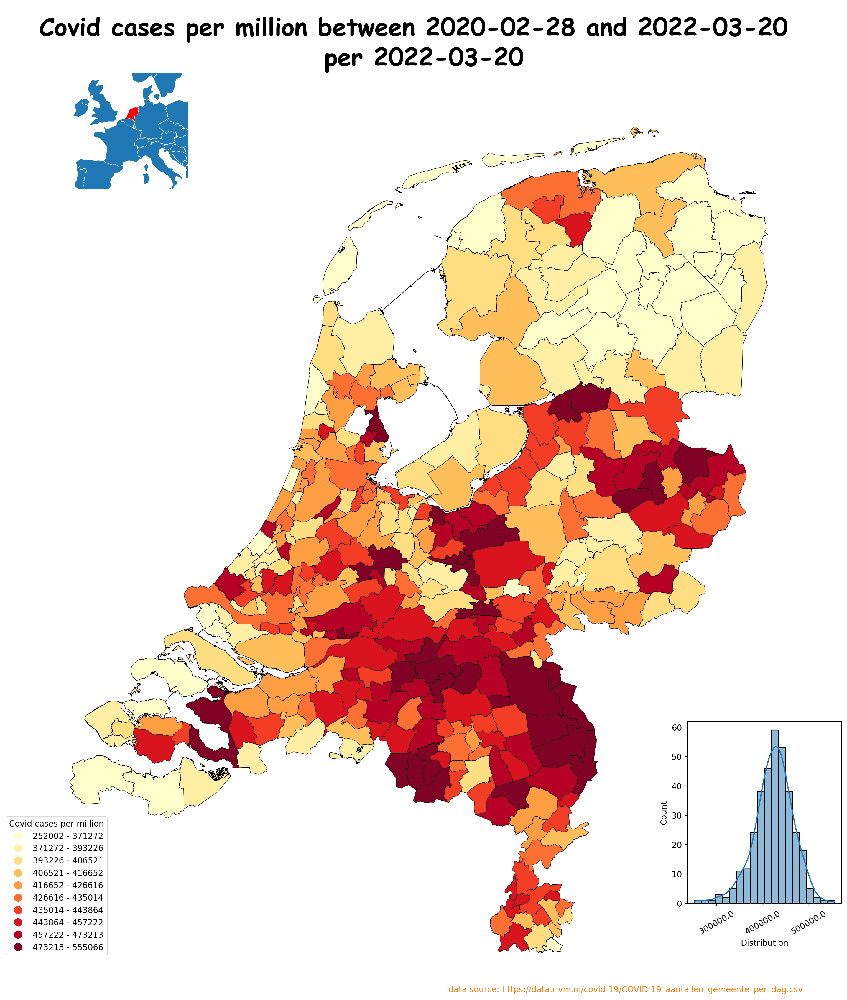

In [35]:
name = 'Covid cases per million'
# column = pd.Series(map_df_combined['CovDensPm'].loc[map_df_combined['CovDensPm']>0], name=name)
column = pd.Series(map_df_combined['CovDensPm'], name=name)
countries = ['Netherlands']
russia = ['Russia']

#plot the density
fig, nl_ax = plt.subplots(figsize=(20, 20))
plt.style.use('default')

nl_ax.axis('off')

# fig.patch.set_facecolor('lightblue')
map_df_combined.plot(column=column, 
                cmap='YlOrRd',#'tab20', 
                label=column, 
                scheme='quantiles',
                legend=True,
                k=10,
                ec='black',
                lw=.5,
                ax=nl_ax)

plt.title(f'{name} between {start} and {stop} \n per {updated}', 
          fontname="Comic Sans MS", fontsize=30, fontweight="bold")

eu_ax = nl_ax.inset_axes([0.05,0.85,.15,.20], fc='white')
world.loc[(world['continent'] == 'Europe') & (~world['name'].isin([countries, russia]))].plot(
    ax=eu_ax, ec='white', lw=.5)
world.loc[world['name'].isin(countries)].plot(
    ax=eu_ax, ec='white', fc = 'red', lw=.5)

eu_ax.patch.set(facecolor = "orange")
eu_ax.set_xlim(-10,20)
eu_ax.set_ylim(38,60)
eu_ax.axis('off')
# get all upper bounds

hist_ax = nl_ax.inset_axes([0.85,0.1,.20,.20], )
# map_df_combined['CovDens'].plot(kind='hist', ax=hist_ax)

x = pd.Series(column, name='Distribution')
sns.histplot(x, bins=20,ax=hist_ax, kde=True)
a=hist_ax.get_xticks().tolist()
hist_ax.set_xticklabels(a, rotation=30)
# hist_ax.set_xticklabels(hist_ax.get_xticklabels(), rotation = 30)
# sns.kdeplot(data=x, c='red', ax=hist_ax, zorder=99)

upper_bounds = mapclassify.Quantiles(column, k=10).bins

# get and format all bounds
bounds = []
for index, upper_bound in enumerate(upper_bounds):
    if index == 0:
        lower_bound = column.min()
    else:
        lower_bound = upper_bounds[index-1]

    # format the numerical legend here
    bound = f'{lower_bound:.0f} - {upper_bound:.0f}'
    bounds.append(bound)

# get all the legend labels
legend_labels = nl_ax.get_legend().get_texts()

# replace the legend labels
for bound, legend_label in zip(bounds, legend_labels):
    legend_label.set_text(bound)
                                     
leg = nl_ax.get_legend()
leg.set_bbox_to_anchor((-0.1, -0.1, 0.2, 0.3))

leg.set_title(name)
plt.setp(leg.get_title(), multialignment='center')
plt.setp(leg.get_texts(), multialignment='center');

text_kwargs = dict(ha='right', va='bottom', fontsize=10, color='C1')

plt.text(1,0,f'data source: {url}', transform=nl_ax.transAxes,
     **text_kwargs);



/Users/maartenk/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:45: UserWarning: FixedFormatter should only be used together with FixedLocator


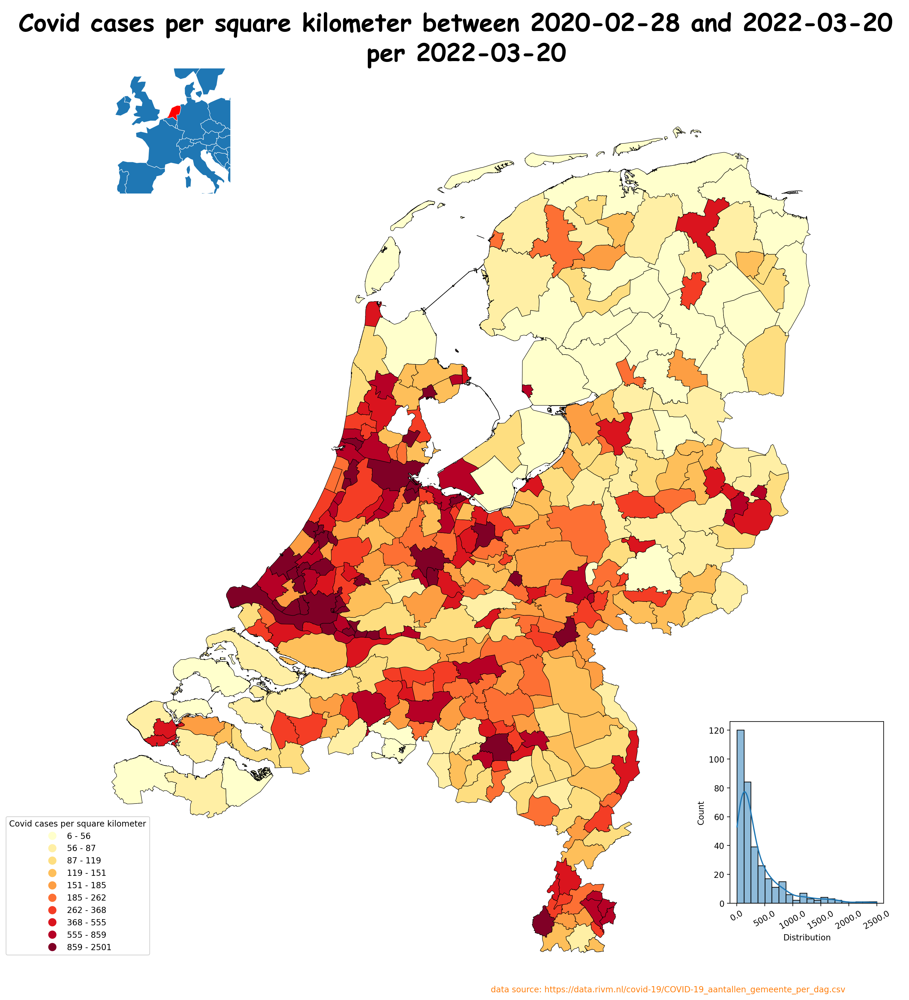

In [36]:
name = 'Covid cases per square kilometer'
# column = pd.Series(map_df_combined['CovDensPm'].loc[map_df_combined['CovDensPm']>0], name=name)
column = pd.Series(map_df_combined['CovPsqKm'], name=name)
countries = ['Netherlands']
russia = ['Russia']

#plot the density
fig, nl_ax = plt.subplots(figsize=(20, 20))
plt.style.use('default')

nl_ax.axis('off')

# fig.patch.set_facecolor('lightblue')
map_df_combined.plot(column=column, 
                cmap='YlOrRd',#'tab20', 
                label=column, 
                scheme='quantiles',
                legend=True,
                k=10,
                ec='black',
                lw=.5,
                ax=nl_ax)

plt.title(f'{name} between {start} and {stop} \n per {updated}', 
          fontname="Comic Sans MS", fontsize=30, fontweight="bold")

eu_ax = nl_ax.inset_axes([0.05,0.85,.15,.20], fc='white')
world.loc[(world['continent'] == 'Europe') & (~world['name'].isin([countries, russia]))].plot(
    ax=eu_ax, ec='white', lw=.5)
world.loc[world['name'].isin(countries)].plot(
    ax=eu_ax, ec='white', fc = 'red', lw=.5)

eu_ax.patch.set(facecolor = "orange")
eu_ax.set_xlim(-10,20)
eu_ax.set_ylim(38,60)
eu_ax.axis('off')
# get all upper bounds

hist_ax = nl_ax.inset_axes([0.85,0.1,.20,.20], )
# map_df_combined['CovDens'].plot(kind='hist', ax=hist_ax)

x = pd.Series(column, name='Distribution')
sns.histplot(x, bins=20,ax=hist_ax, kde=True)
a=hist_ax.get_xticks().tolist()
hist_ax.set_xticklabels(a, rotation=30)
# hist_ax.set_xticklabels(hist_ax.get_xticklabels(), rotation = 30)
# sns.kdeplot(data=x, c='red', ax=hist_ax, zorder=99)

upper_bounds = mapclassify.Quantiles(column, k=10).bins

# get and format all bounds
bounds = []
for index, upper_bound in enumerate(upper_bounds):
    if index == 0:
        lower_bound = column.min()
    else:
        lower_bound = upper_bounds[index-1]

    # format the numerical legend here
    bound = f'{lower_bound:.0f} - {upper_bound:.0f}'
    bounds.append(bound)

# get all the legend labels
legend_labels = nl_ax.get_legend().get_texts()

# replace the legend labels
for bound, legend_label in zip(bounds, legend_labels):
    legend_label.set_text(bound)
                                     
leg = nl_ax.get_legend()
leg.set_bbox_to_anchor((-0.1, -0.1, 0.2, 0.3))

leg.set_title(name)
plt.setp(leg.get_title(), multialignment='center')
plt.setp(leg.get_texts(), multialignment='center');

text_kwargs = dict(ha='right', va='bottom', fontsize=10, color='C1')

plt.text(1,0,f'data source: {url}', transform=nl_ax.transAxes,
     **text_kwargs);



<AxesSubplot:ylabel='Frequency'>

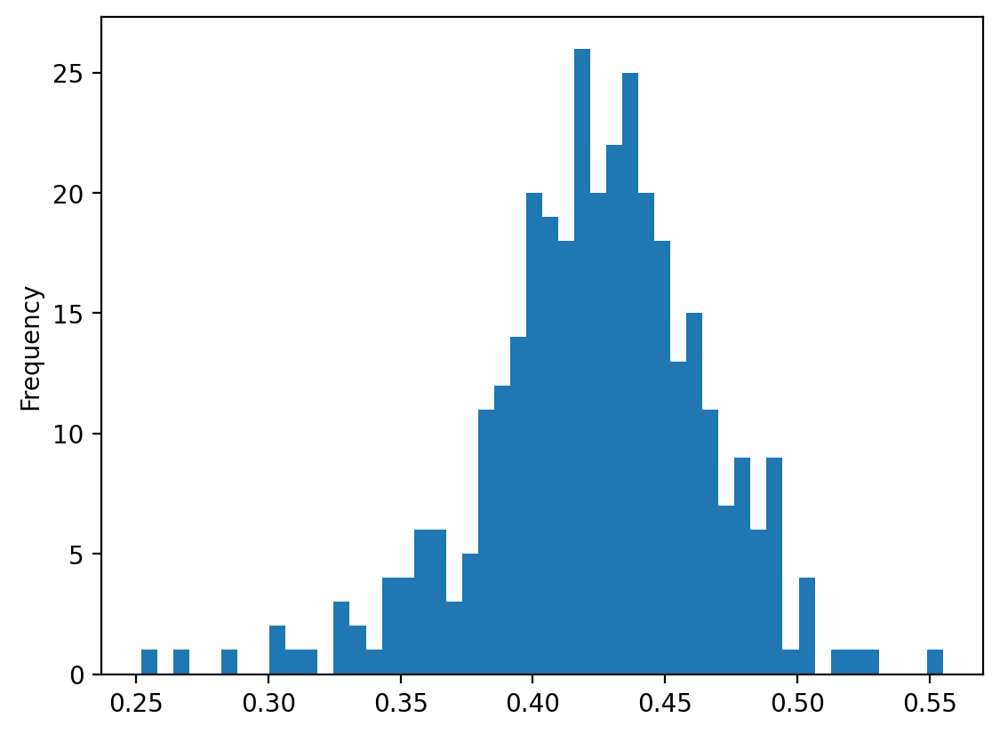

In [39]:
map_df_combined['CovDens'].plot(kind='hist', bins=50)
# map_df_combined['CovDens'].plot(kind='kde', secondary_y=False)

In [33]:
map_df_combined.crs

<Projected CRS: EPSG:28992>
Name: Amersfoort / RD New
Axis Info [cartesian]:
- X[east]: Easting (metre)
- Y[north]: Northing (metre)
Area of Use:
- name: Netherlands - onshore, including Waddenzee, Dutch Wadden Islands and 12-mile offshore coastal zone.
- bounds: (3.2, 50.75, 7.22, 53.7)
Coordinate Operation:
- name: RD New
- method: Oblique Stereographic
Datum: Amersfoort
- Ellipsoid: Bessel 1841
- Prime Meridian: Greenwich

In [59]:
map_df_combined_be = pd.read_pickle('cookbooks/sources/map_df_combined_be')

In [71]:
map_df_combined_be['geometry'] = map_df_combined_be['geometry'].translate(xoff=-35000, yoff=-45000, zoff=0)

In [61]:
map_df_combined_de = pd.read_pickle('cookbooks/sources/map_df_combined_de')

In [72]:
map_df_combined_de['geometry'] = map_df_combined_de['geometry'].translate(xoff=30000, yoff=-10000, zoff=0)

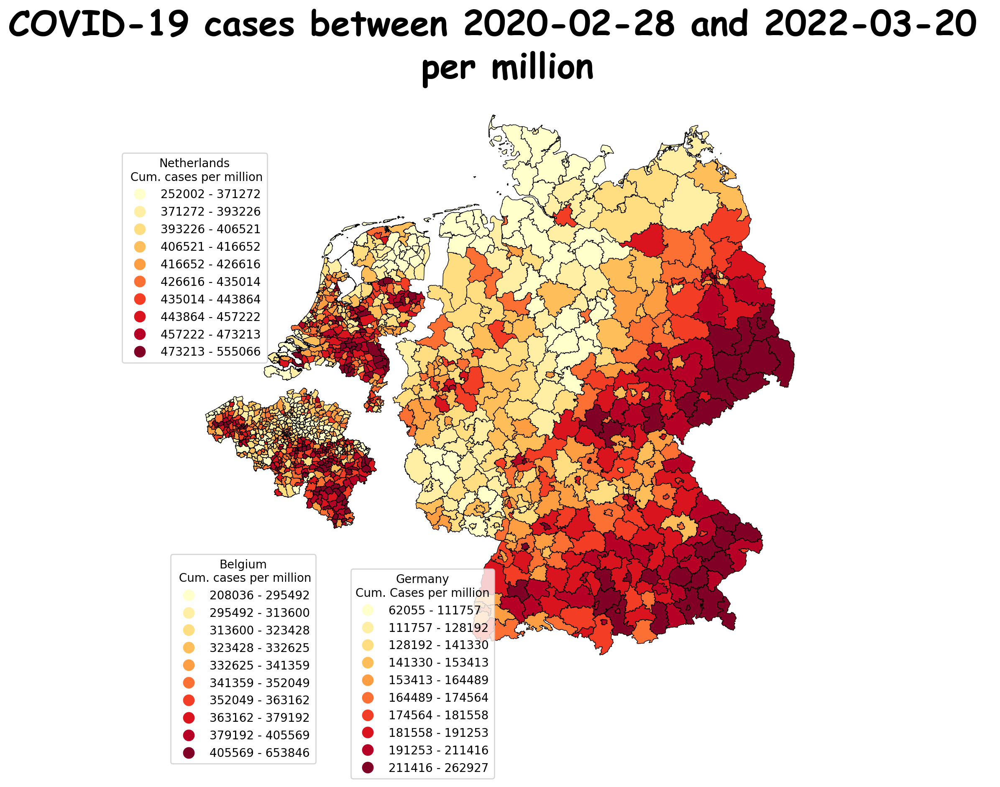

In [73]:
#plot the density
plt.figure(figsize=(10,10))
ax = plt.axes()
ax.axis('off')
fig.set_facecolor('lightblue')


nl = map_df_combined.loc[map_df_combined['CovDensPm']>0].plot(column='CovDensPm', 
                cmap='YlOrRd',#'tab20', 
                label=map_df_combined['CovDensPm'], 
                scheme='quantiles',
                legend=True,
                k=10,
                ec='black',
                lw=.5,
                ax=ax)

#Add legend
upper_bounds = mapclassify.Quantiles(map_df_combined['CovDensPm'], k=10).bins

# get and format all bounds
bounds = []
for index, upper_bound in enumerate(upper_bounds):
    if index == 0:
        lower_bound = map_df_combined['CovDensPm'].min()
    else:
        lower_bound = upper_bounds[index-1]

    # format the numerical legend here
    bound = f'{lower_bound:.0f} - {upper_bound:.0f}'
    bounds.append(bound)

# get all the legend labels
legend_labels = nl.get_legend().get_texts()

# replace the legend labels
for bound, legend_label in zip(bounds, legend_labels):
    legend_label.set_text(bound)
    
legnl = nl.get_legend()
legnl.set_bbox_to_anchor((0.05, 0.75, 0.1, 0.15))

legnl.set_title('Netherlands\n Cum. cases per million')
plt.setp(legnl.get_title(), multialignment='center')
plt.setp(legnl.get_texts(), multialignment='center')

ax.add_artist(legnl)

be = map_df_combined_be.loc[map_df_combined_be['CovDensPm']>0].plot(column='CovDensPm', 
                cmap='YlOrRd',#'tab20', 
                label=map_df_combined_be['CovDensPm'], 
                scheme='quantiles',
                legend=True,
                k=10,
                ec='black',
                lw=.5,
                ax=ax)

upper_bounds = mapclassify.Quantiles(map_df_combined_be['CovDensPm'], k=10).bins

# get and format all bounds
bounds = []
for index, upper_bound in enumerate(upper_bounds):
    if index == 0:
        lower_bound = map_df_combined_be['CovDensPm'].min()
    else:
        lower_bound = upper_bounds[index-1]

    # format the numerical legend here
    bound = f'{lower_bound:.0f} - {upper_bound:.0f}'
    bounds.append(bound)

# get all the legend labels
legend_labels = nl.get_legend().get_texts()

# replace the legend labels
for bound, legend_label in zip(bounds, legend_labels):
    legend_label.set_text(bound)
    
be_leg = be.get_legend()
be_leg.set_bbox_to_anchor((0.125, 0.075, 0.1, 0.15))

be_leg.set_title('Belgium\n Cum. cases per million')
plt.setp(be_leg.get_title(), multialignment='center')
plt.setp(be_leg.get_texts(), multialignment='center')

ax.add_artist(be_leg)

de = map_df_combined_de.plot(column='CovDensPm', 
                cmap='YlOrRd',#'tab20', 
                label=map_df_combined_de['CovDensPm'], 
                scheme='quantiles',
                legend=True,
                k=10,
                ec='black',
                lw=.5,
                ax=ax)



# ax.add_artist(de_leg)
upper_bounds = mapclassify.Quantiles(map_df_combined_de['CovDensPm'], k=10).bins

# get and format all bounds
bounds = []
for index, upper_bound in enumerate(upper_bounds):
    if index == 0:
        lower_bound = map_df_combined_de['CovDensPm'].min()
    else:
        lower_bound = upper_bounds[index-1]

    # format the numerical legend here
    bound = f'{lower_bound:.0f} - {upper_bound:.0f}'
    bounds.append(bound)

# get all the legend labels
legend_labels = nl.get_legend().get_texts()

# replace the legend labels
for bound, legend_label in zip(bounds, legend_labels):
    legend_label.set_text(bound)

plt.title(f'COVID-19 cases between {start} and {stop} \n per million', fontname="Comic Sans MS", fontsize=30, fontweight="bold")


leg = ax.get_legend()
leg.set_bbox_to_anchor((.4, 0.05, 0.1, 0.15))
leg.set_title('Germany\nCum. Cases per million')
plt.setp(leg.get_title(), multialignment='center')
plt.setp(leg.get_texts(), multialignment='center');

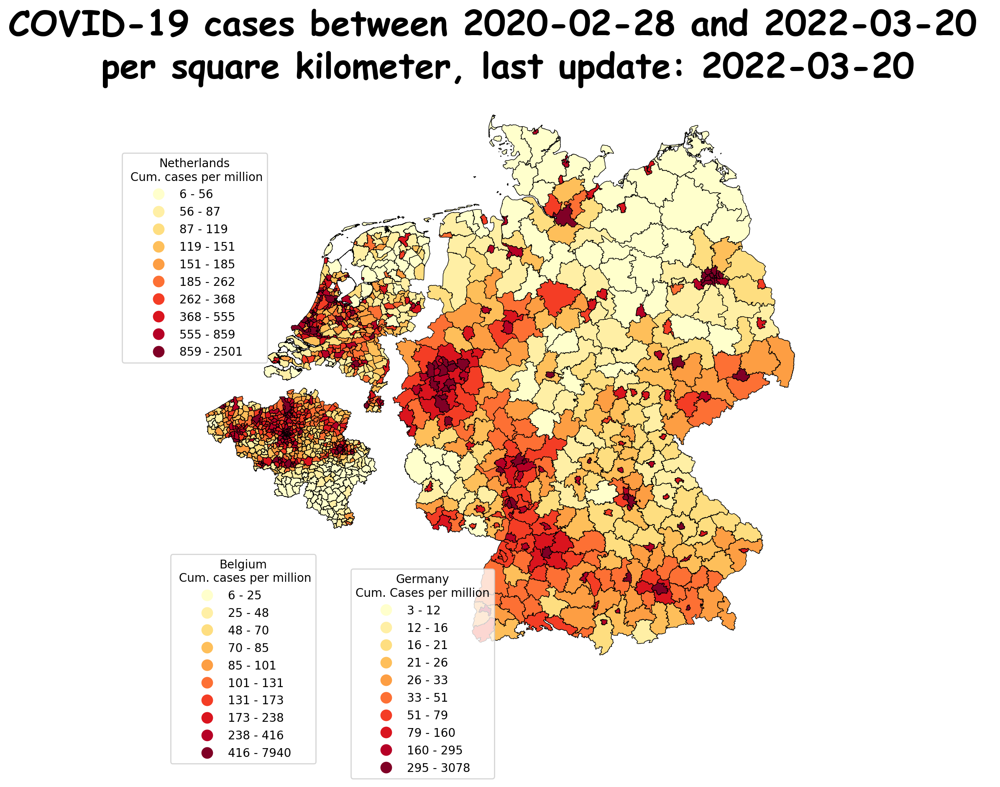

In [63]:
#plot the density
plt.figure(figsize=(10,10))
ax = plt.axes()
ax.axis('off')
fig.set_facecolor('lightblue')


nl = map_df_combined.loc[map_df_combined['CovPsqKm']>0].plot(column='CovPsqKm', 
                cmap='YlOrRd',#'tab20', 
                label=map_df_combined['CovPsqKm'], 
                scheme='quantiles',
                legend=True,
                k=10,
                ec='black',
                lw=.5,
                ax=ax)

#Add legend
upper_bounds = mapclassify.Quantiles(map_df_combined['CovPsqKm'], k=10).bins

# get and format all bounds
bounds = []
for index, upper_bound in enumerate(upper_bounds):
    if index == 0:
        lower_bound = map_df_combined['CovPsqKm'].min()
    else:
        lower_bound = upper_bounds[index-1]

    # format the numerical legend here
    bound = f'{lower_bound:.0f} - {upper_bound:.0f}'
    bounds.append(bound)

# get all the legend labels
legend_labels = nl.get_legend().get_texts()

# replace the legend labels
for bound, legend_label in zip(bounds, legend_labels):
    legend_label.set_text(bound)
    
legnl = nl.get_legend()
legnl.set_bbox_to_anchor((0.05, 0.75, 0.1, 0.15))

legnl.set_title('Netherlands\n Cum. cases per million')
plt.setp(legnl.get_title(), multialignment='center')
plt.setp(legnl.get_texts(), multialignment='center')

ax.add_artist(legnl)

be = map_df_combined_be.loc[map_df_combined_be['CovPsqKm']>0].plot(column='CovPsqKm', 
                cmap='YlOrRd',#'tab20', 
                label=map_df_combined_be['CovPsqKm'], 
                scheme='quantiles',
                legend=True,
                k=10,
                ec='black',
                lw=.5,
                ax=ax)

upper_bounds = mapclassify.Quantiles(map_df_combined_be['CovPsqKm'], k=10).bins

# get and format all bounds
bounds = []
for index, upper_bound in enumerate(upper_bounds):
    if index == 0:
        lower_bound = map_df_combined['CovPsqKm'].min()
    else:
        lower_bound = upper_bounds[index-1]

    # format the numerical legend here
    bound = f'{lower_bound:.0f} - {upper_bound:.0f}'
    bounds.append(bound)

# get all the legend labels
legend_labels = nl.get_legend().get_texts()

# replace the legend labels
for bound, legend_label in zip(bounds, legend_labels):
    legend_label.set_text(bound)
    
be_leg = be.get_legend()
be_leg.set_bbox_to_anchor((0.125, 0.075, 0.1, 0.15))

be_leg.set_title('Belgium\n Cum. cases per million')
plt.setp(be_leg.get_title(), multialignment='center')
plt.setp(be_leg.get_texts(), multialignment='center')

ax.add_artist(be_leg)

de = map_df_combined_de.plot(column='CovPsqKm', 
                cmap='YlOrRd',#'tab20', 
                label=map_df_combined_de['CovPsqKm'], 
                scheme='quantiles',
                legend=True,
                k=10,
                ec='black',
                lw=.5,
                ax=ax)



# ax.add_artist(de_leg)
upper_bounds = mapclassify.Quantiles(map_df_combined_de['CovPsqKm'], k=10).bins

# get and format all bounds
bounds = []
for index, upper_bound in enumerate(upper_bounds):
    if index == 0:
        lower_bound = map_df_combined_de['CovPsqKm'].min()
    else:
        lower_bound = upper_bounds[index-1]

    # format the numerical legend here
    bound = f'{lower_bound:.0f} - {upper_bound:.0f}'
    bounds.append(bound)

# get all the legend labels
legend_labels = nl.get_legend().get_texts()

# replace the legend labels
for bound, legend_label in zip(bounds, legend_labels):
    legend_label.set_text(bound)

plt.title(f'COVID-19 cases between {start} and {stop} \n per square kilometer, last update: {updated}', fontname="Comic Sans MS", fontsize=30, fontweight="bold")


leg = ax.get_legend()
leg.set_bbox_to_anchor((.4, 0.05, 0.1, 0.15))
leg.set_title('Germany\nCum. Cases per million')
plt.setp(leg.get_title(), multialignment='center')
plt.setp(leg.get_texts(), multialignment='center');

In [64]:
map_df_combined_be = pd.read_pickle('cookbooks/sources/map_df_combined_be')

In [65]:
map_df_combined_de = pd.read_pickle('cookbooks/sources/map_df_combined_de')

In [66]:
map_df_combined_bene = map_df_combined_be[['geometry', 'CovDens','CovDensPm', 'CovPsqKm']].append(map_df_combined
                                                                           [['geometry', 'CovDens', 'CovDensPm','CovPsqKm']])

In [57]:
map_df_combined_benede = map_df_combined_bene[['geometry', 'CovDens', 'CovDensPm', 'CovPsqKm']].append(map_df_combined_de
                                                                           [['geometry', 'CovDens','CovDensPm', 'CovPsqKm']])

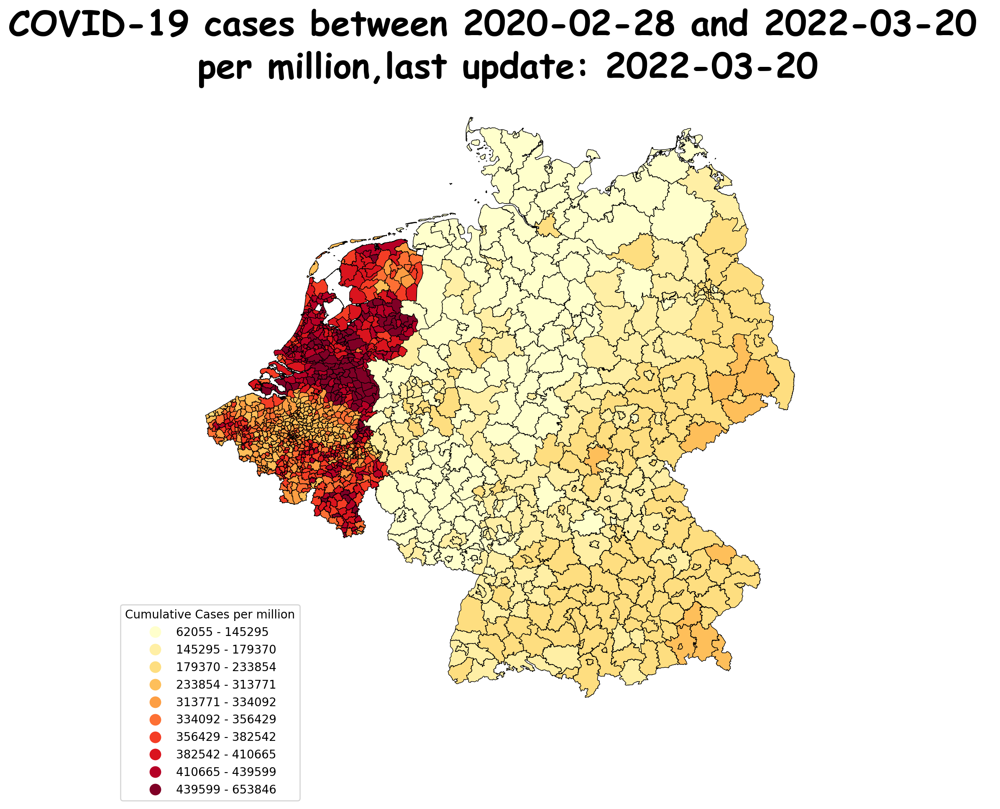

In [69]:
#plot the density
plt.figure(figsize=(10,10))
ax = plt.axes()

ax.axis('off')


map_df_combined_benede.loc[map_df_combined_benede['CovDensPm']>0].plot(column='CovDensPm', 
                cmap='YlOrRd',#'tab20', 
                label=map_df_combined_benede['CovDensPm'], 
                scheme='quantiles',
                legend=True,
                k=10,
                                                       ec='black',
                                                         lw=.5,
                ax=ax)

upper_bounds = mapclassify.Quantiles(map_df_combined_benede['CovDensPm'], k=10).bins
# get and format all bounds
bounds = []
for index, upper_bound in enumerate(upper_bounds):
    if index == 0:
        lower_bound = map_df_combined_benede['CovDensPm'].min()
    else:
        lower_bound = upper_bounds[index-1]

    # format the numerical legend here
    bound = f'{lower_bound:.0f} - {upper_bound:.0f}'
    bounds.append(bound)

# get all the legend labels
legend_labels = ax.get_legend().get_texts()

# replace the legend labels
for bound, legend_label in zip(bounds, legend_labels):
    legend_label.set_text(bound)


plt.title(f'COVID-19 cases between {start} and {stop} \n per million,last update: {updated}', fontname="Comic Sans MS", fontsize=30, fontweight="bold")
leg = ax.get_legend();
leg.set_bbox_to_anchor((0., 0., 0.2, 0.2))
leg.set_title('Cumulative Cases per million');

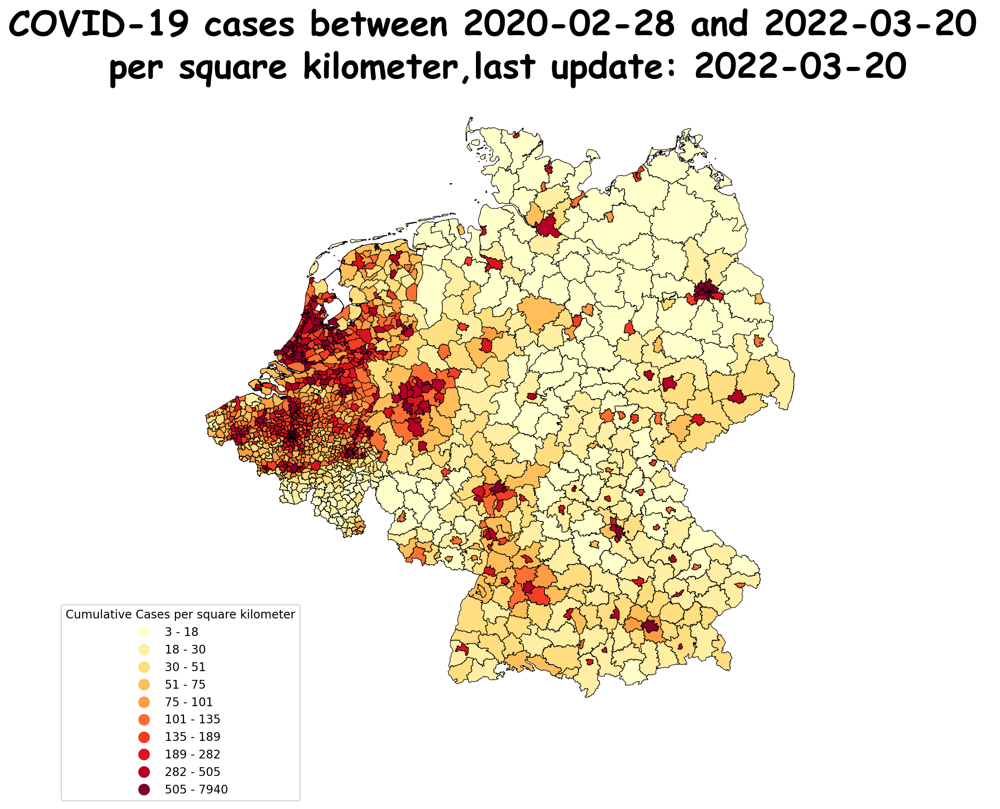

In [78]:
#plot the density
plt.figure(figsize=(10,10))
ax = plt.axes()

ax.axis('off')


map_df_combined_benede.loc[map_df_combined_benede['CovPsqKm']>0].plot(column='CovPsqKm', 
                cmap='YlOrRd',#'tab20', 
                label=map_df_combined_benede['CovPsqKm'], 
                scheme='quantiles',
                legend=True,
                k=10,
                                                       ec='black',
                                                         lw=.5,
                ax=ax)

upper_bounds = mapclassify.Quantiles(map_df_combined_benede['CovPsqKm'], k=10).bins
# get and format all bounds
bounds = []
for index, upper_bound in enumerate(upper_bounds):
    if index == 0:
        lower_bound = map_df_combined_benede['CovPsqKm'].min()
    else:
        lower_bound = upper_bounds[index-1]

    # format the numerical legend here
    bound = f'{lower_bound:.0f} - {upper_bound:.0f}'
    bounds.append(bound)

# get all the legend labels
legend_labels = ax.get_legend().get_texts()

# replace the legend labels
for bound, legend_label in zip(bounds, legend_labels):
    legend_label.set_text(bound)


plt.title(f'COVID-19 cases between {start} and {stop} \n per square kilometer,last update: {updated}', fontname="Comic Sans MS", fontsize=30, fontweight="bold")
leg = ax.get_legend();
leg.set_bbox_to_anchor((0., 0., 0.2, 0.2))
leg.set_title('Cumulative Cases per square kilometer');

In [215]:
map_df_combined['HostDens']= (map_df_combined['Hospital_admission']/map_df_combined['AANT_INW'])*1000000

KeyError: 'Hospital_admission'

In [106]:
grouped = df.groupby('Date_of_publication').sum()

In [224]:
map_df_combined['DecDens']= (map_df_combined['Deceased']/map_df_combined['AANT_INW'])*1000000

/Users/maartenk/opt/anaconda3/lib/python3.7/site-packages/mapclassify/classifiers.py:236: UserWarning: Warning: Not enough unique values in array to form k classes
  "Warning: Not enough unique values in array to form k classes", UserWarning
/Users/maartenk/opt/anaconda3/lib/python3.7/site-packages/mapclassify/classifiers.py:238: UserWarning: Warning: setting k to 4
  Warn("Warning: setting k to %d" % k_q, UserWarning)


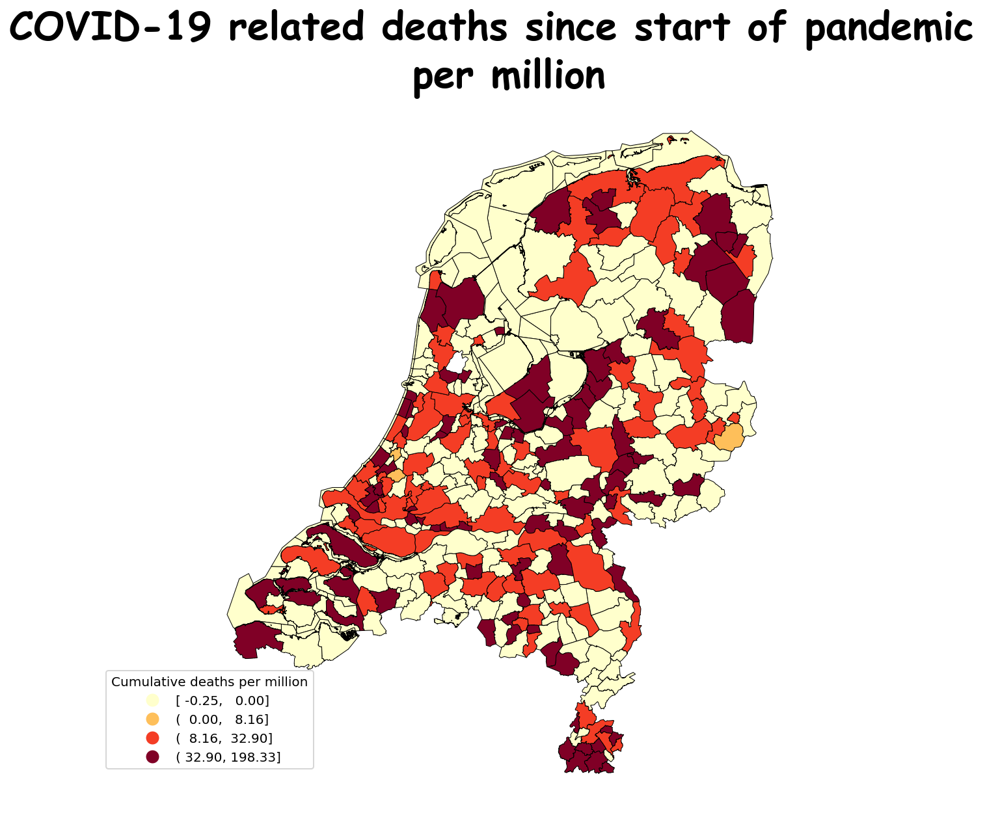

In [228]:
#plot the density
plt.figure(figsize=(10,10))
ax = plt.axes()

ax.axis('off')

# map_df_combined.loc[map_df_combined['DecDens']>0].plot(column='DecDens', 
# map_df_combined.loc[map_df_combined['DecDens']>0].plot(column='DecDens', 

map_df_combined.plot(column='DecDens', 


                cmap='YlOrRd',#'tab20', 
                label=map_df_combined['DecDens'], 
                scheme='quantiles',
                legend=True,
                k=5,
                                                       ec='black',
                                                       lw=.5,
                ax=ax)
plt.title('COVID-19 related deaths since start of pandemic \n per million', fontname="Comic Sans MS", fontsize=30, fontweight="bold")
leg = ax.get_legend();
leg.set_bbox_to_anchor((0., 0., 0.2, 0.2))
leg.set_title('Cumulative deaths per million');

In [28]:
len(df['Municipality_name'].unique())

346

In [29]:
map_df_gemeenten['gemeentenaam']

0             Drimmelen
1            Westvoorne
2          Scherpenzeel
3         Gulpen-Wittem
4            Hardenberg
             ...       
350       Echt-Susteren
351          Beekdaelen
352              Altena
353         West Betuwe
354    Vijfheerenlanden
Name: gemeentenaam, Length: 355, dtype: object

In [30]:
set(df['Municipality_name']).intersection(map_df_gemeenten['gemeentenaam'])

{"'s-Gravenhage",
 "'s-Hertogenbosch",
 'Aa en Hunze',
 'Aalsmeer',
 'Aalten',
 'Achtkarspelen',
 'Alblasserdam',
 'Albrandswaard',
 'Alkmaar',
 'Almelo',
 'Almere',
 'Alphen aan den Rijn',
 'Alphen-Chaam',
 'Altena',
 'Ameland',
 'Amersfoort',
 'Amstelveen',
 'Amsterdam',
 'Apeldoorn',
 'Arnhem',
 'Assen',
 'Asten',
 'Baarle-Nassau',
 'Baarn',
 'Barendrecht',
 'Barneveld',
 'Beek',
 'Beekdaelen',
 'Beesel',
 'Berg en Dal',
 'Bergeijk',
 'Bergen (L.)',
 'Bergen (NH.)',
 'Bergen op Zoom',
 'Berkelland',
 'Bernheze',
 'Best',
 'Beuningen',
 'Beverwijk',
 'Bladel',
 'Blaricum',
 'Bloemendaal',
 'Bodegraven-Reeuwijk',
 'Boekel',
 'Borger-Odoorn',
 'Borne',
 'Borsele',
 'Boxtel',
 'Breda',
 'Brielle',
 'Bronckhorst',
 'Brummen',
 'Brunssum',
 'Bunnik',
 'Bunschoten',
 'Buren',
 'Capelle aan den IJssel',
 'Castricum',
 'Coevorden',
 'Cranendonck',
 'Culemborg',
 'Dalfsen',
 'Dantumadiel',
 'De Bilt',
 'De Fryske Marren',
 'De Ronde Venen',
 'De Wolden',
 'Delft',
 'Den Helder',
 'Deurne',
 '

In [31]:
set(df['Municipality_name']).symmetric_difference(map_df_gemeenten['gemeentenaam'])
# set([1, 2]).symmetric_difference(set([2, 3]))

{'Appingedam',
 'Beemster',
 'Boxmeer',
 'Cuijk',
 'Delfzijl',
 'Dijk en Waard',
 'Eemsdelta',
 'Grave',
 'Haaren',
 'Heerhugowaard',
 'Land van Cuijk',
 'Landerd',
 'Langedijk',
 'Loppersum',
 'Maashorst',
 'Mill en Sint Hubert',
 'Sint Anthonis',
 'Uden',
 nan}

In [32]:
set(df['Municipality_name'])-set(map_df_gemeenten['gemeentenaam'])



{'Dijk en Waard', 'Eemsdelta', 'Land van Cuijk', 'Maashorst', nan}

In [33]:
set(map_df_gemeenten['gemeentenaam'])-set(df['Municipality_name'])



{'Appingedam',
 'Beemster',
 'Boxmeer',
 'Cuijk',
 'Delfzijl',
 'Grave',
 'Haaren',
 'Heerhugowaard',
 'Landerd',
 'Langedijk',
 'Loppersum',
 'Mill en Sint Hubert',
 'Sint Anthonis',
 'Uden'}

In [66]:
import shapely
shapely.geos.geos_version

(3, 8, 0)

In [175]:
type(map_df_combined)

geopandas.geodataframe.GeoDataFrame

In [54]:
groupedDate= df.groupby('Date_of_publication').sum()

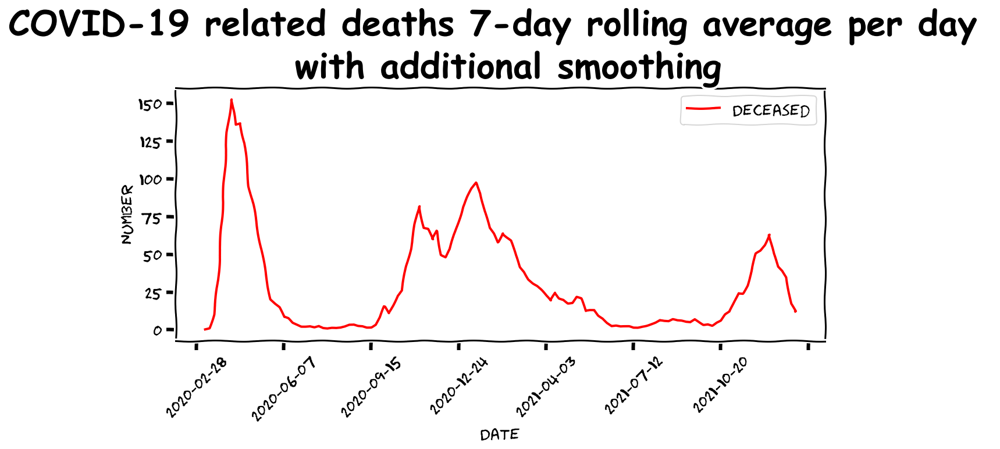

In [242]:
# plt.xkcd();
groupedDate['Deceased'].rolling(7).mean()[::5].plot(legend=True, c='red', figsize=(10,4))
# groupedDate['Hospital_admission'].rolling(7).mean()[::5].plot(legend=True, c='blue', figsize=(10,4))
# groupedDate['Total_reported'].rolling(7).mean()[::5].plot(legend=True, c='red', figsize=(10,4))

plt.title('COVID-19 related deaths 7-day rolling average per day \n with additional smoothing', fontname="Comic Sans MS", fontsize=30, fontweight="bold")
leg = ax.get_legend();
leg.set_bbox_to_anchor((0., 0., 0.2, 0.2))
leg.set_title('Cumulative deaths per million')
plt.ylabel('Number')
plt.xlabel('Date')
plt.xticks(rotation=45);

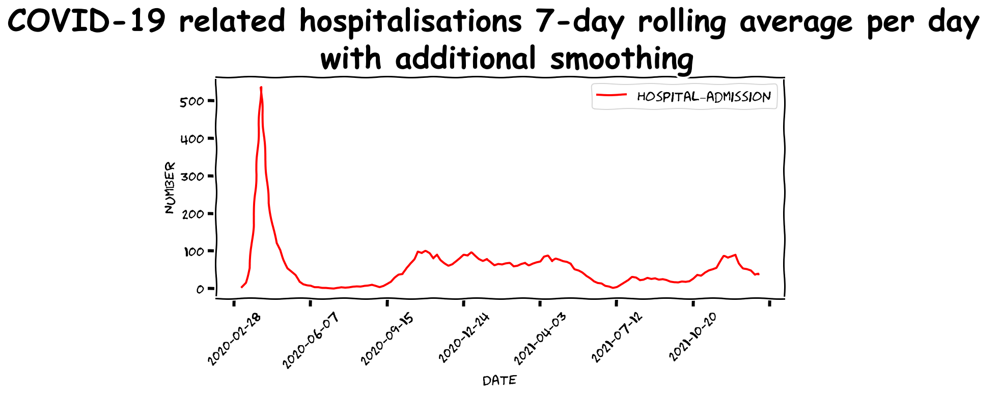

In [192]:
# plt.xkcd();
groupedDate['Hospital_admission'].rolling(7).mean()[::5].plot(legend=True, c='red', figsize=(10,4))
plt.title('COVID-19 related hospitalisations 7-day rolling average per day \n with additional smoothing', fontname="Comic Sans MS", fontsize=30, fontweight="bold")
leg = ax.get_legend();
leg.set_bbox_to_anchor((0., 0., 0.2, 0.2))
leg.set_title('Cumulative deaths per million')
plt.xlabel('Date')
plt.ylabel('Number')
plt.xticks(rotation=45);

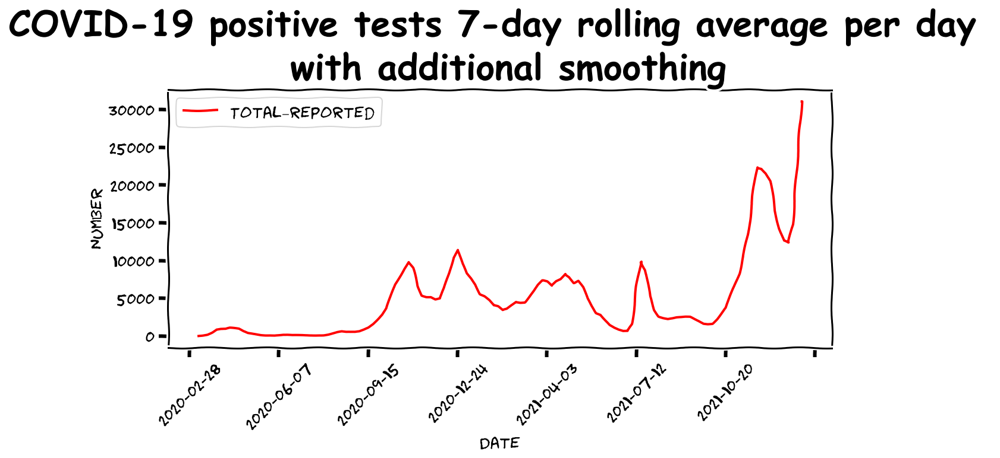

In [191]:
# plt.xkcd();
groupedDate['Total_reported'].rolling(7).mean()[::5].plot(legend=True, c='red', figsize=(10,4))

plt.title('COVID-19 positive tests 7-day rolling average per day \n with additional smoothing', fontname="Comic Sans MS", fontsize=30, fontweight="bold")
leg = ax.get_legend();
leg.set_bbox_to_anchor((0., 0., 0.2, 0.2))
leg.set_title('Cumulative deaths per million')
plt.xlabel('Date')
plt.ylabel('Number')
plt.xticks(rotation=45);

In [195]:
from sklearn.preprocessing import StandardScaler 
import pandas as pd

std_scaler = StandardScaler()
 
df_scaled = std_scaler.fit_transform(groupedDate.to_numpy())
df_scaled = pd.DataFrame(df_scaled, columns=['Total_reported','Hospital_admission','Deceased'], index = groupedDate.index)

Text(0.5, 0, 'Date')

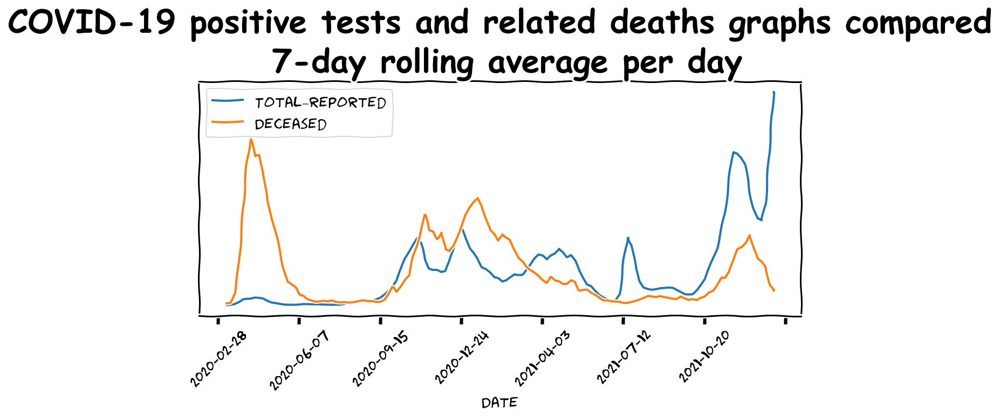

In [240]:
# plt.xkcd();
df_scaled[['Total_reported','Deceased']].rolling(7).mean()[::5].plot(legend=True, figsize=(10,4))
plt.xticks(rotation=45)
plt.yticks([])
plt.title('COVID-19 positive tests and related deaths graphs compared\n 7-day rolling average per day', fontname="Comic Sans MS", fontsize=30, fontweight="bold")

# plt.ylabel()


plt.xlabel('Date')
# ax.axis('off');



In [197]:
from sklearn.preprocessing import RobustScaler
import pandas as pd

rob_scaler = RobustScaler()
 
df_Rscaled = rob_scaler.fit_transform(groupedDate.to_numpy())
df_Rscaled = pd.DataFrame(df_Rscaled, columns=['Total_reported','Hospital_admission','Deceased'], index = groupedDate.index)

<AxesSubplot:xlabel='Date_of_publication'>

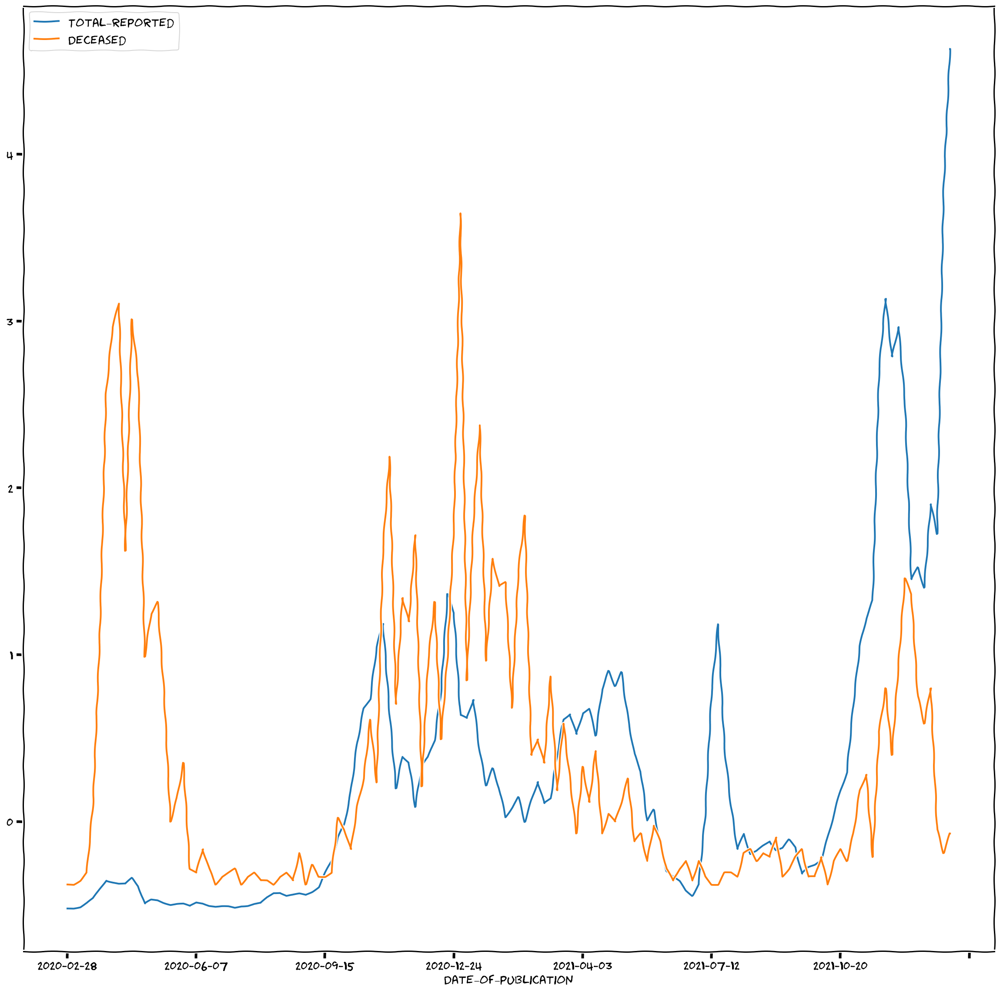

In [198]:
df_Rscaled[['Total_reported','Deceased']][::5].plot(figsize=(20,20))

,Total_reported,Hospital_admission,Deceased
Date_of_publication,,,
2020-02-28,1,1,0
2020-02-29,1,0,0
2020-03-01,3,1,0
2020-03-02,5,0,0
2020-03-03,4,1,0
...,...,...,...
2022-01-10,27933,31,8
2022-01-11,29039,31,18
2022-01-12,32109,35,8


<AxesSubplot:xlabel='Date_of_publication'>

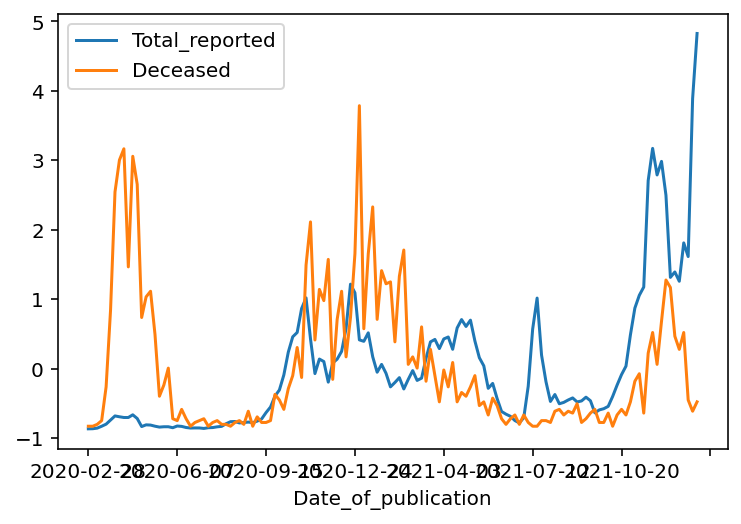

In [180]:
df_scaled[['Total_reported','Deceased']][::5].plot()

<AxesSubplot:xlabel='Date_of_publication'>

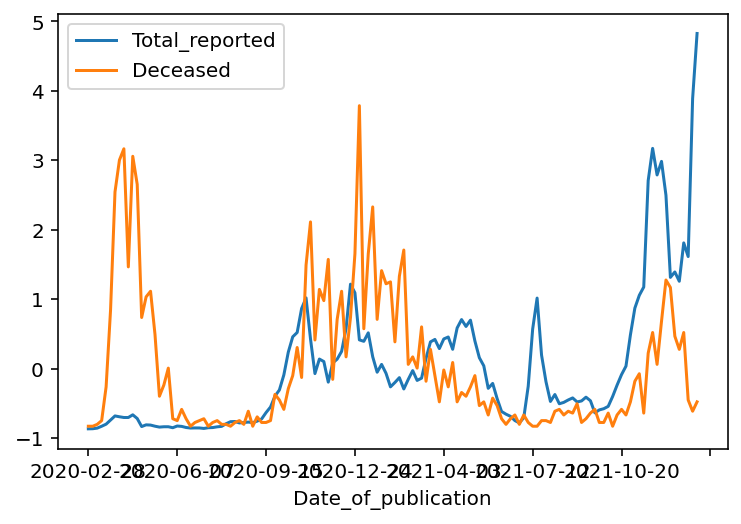

In [180]:
df_scaled[['Total_reported','Deceased']][::5].plot()

<AxesSubplot:xlabel='Date_of_publication'>

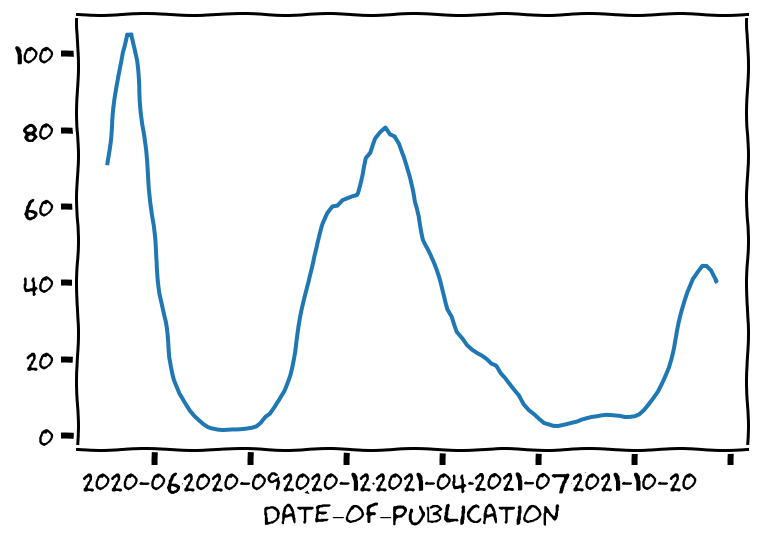

In [199]:
groupedDate['Deceased'].rolling(50).mean()[::5].plot()

<AxesSubplot:xlabel='Date_of_publication'>

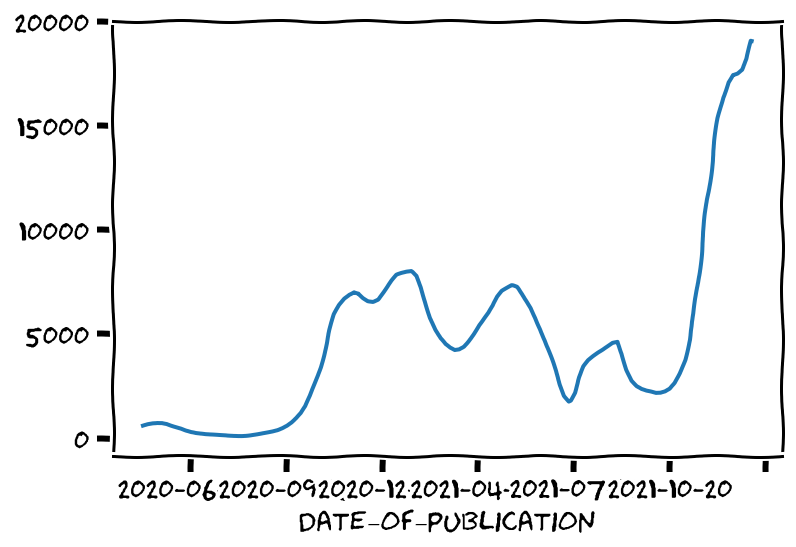

In [200]:
groupedDate['Total_reported'].rolling(50).mean()[::5].plot()

<AxesSubplot:xlabel='Date_of_publication'>

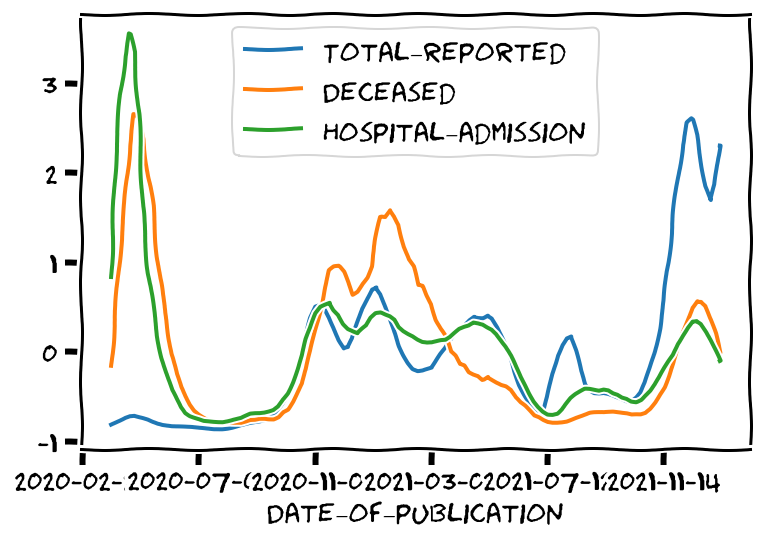

In [201]:
df_scaled[['Total_reported','Deceased','Hospital_admission']].rolling(30).mean()[::5].plot()

In [10]:
import tabula
df_ = tabula.read_pdf('/Users/maartenk/Documents/git/CookBooks/Sources/Kiemsurveillance-20220114-tabel-Nederlands.pdf',
                      output_format='dataframe',
                     pages='all')

In [11]:
# display each of the dataframes
for df in df_:
    print(df.shape)
    df.head()

(10, 59)


In [12]:
df_ = df_[0]

In [13]:
df_['virus'] = df_['Weeknummer']

In [14]:
df_ = df_.drop('Weeknummer', axis=1)
# df_['Weeknummer']

In [15]:
df_

,Totaal,2021/52,2021/51,2021/50,2021/49,2021/48,2021/47,2021/46,2021/45,2021/44,...,2021/4,2021/3,2021/2,2021/1,2020/53,2020/52,2020/51,2020/50,2020/49,virus
0,76838.0,611.0,1489.0,1830.0,1877.0,1896.0,1927.0,1894.0,1803.0,1994.0,...,876.0,651.0,305.0,356.0,207.0,257.0,203.0,127.0,75.0,Aantal onderzochte monsters
1,26267.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,216.0,158.0,60.0,45.0,9.0,5.0,1.0,1.0,1.0,Alfa (B.1.1.7)
2,439.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,14.0,3.0,3.0,0.0,1.0,1.0,0.0,0.0,0.0,Beta (B.1.351)
3,384.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Gamma (P.1)
4,43486.0,254.0,1061.0,1663.0,1848.0,1885.0,1923.0,1894.0,1803.0,1994.0,...,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,Delta (B.1.617.2)
5,463.0,3.0,50.0,58.0,60.0,50.0,50.0,44.0,42.0,42.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,AY.4.2*
6,46.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Mu (B.1.621)
7,11.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Lambda (C.37)
8,994.0,357.0,428.0,166.0,28.0,11.0,4.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Omikron (B.1.1.529)
9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [16]:
df_ = df_.drop('Totaal', axis=1)

In [17]:
df_

,2021/52,2021/51,2021/50,2021/49,2021/48,2021/47,2021/46,2021/45,2021/44,2021/43,...,2021/4,2021/3,2021/2,2021/1,2020/53,2020/52,2020/51,2020/50,2020/49,virus
0,611.0,1489.0,1830.0,1877.0,1896.0,1927.0,1894.0,1803.0,1994.0,1913.0,...,876.0,651.0,305.0,356.0,207.0,257.0,203.0,127.0,75.0,Aantal onderzochte monsters
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,216.0,158.0,60.0,45.0,9.0,5.0,1.0,1.0,1.0,Alfa (B.1.1.7)
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,14.0,3.0,3.0,0.0,1.0,1.0,0.0,0.0,0.0,Beta (B.1.351)
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Gamma (P.1)
4,254.0,1061.0,1663.0,1848.0,1885.0,1923.0,1894.0,1803.0,1994.0,1912.0,...,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,Delta (B.1.617.2)
5,3.0,50.0,58.0,60.0,50.0,50.0,44.0,42.0,42.0,23.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,AY.4.2*
6,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Mu (B.1.621)
7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Lambda (C.37)
8,357.0,428.0,166.0,28.0,11.0,4.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Omikron (B.1.1.529)
9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [18]:
df_ = pd.DataFrame(df_, columns=df_.columns[::-1])

In [19]:
df_=df_.drop(0)

In [20]:
df_ = df_.set_index('virus')

In [21]:
df_# = df_.T

,2020/49,2020/50,2020/51,2020/52,2020/53,2021/1,2021/2,2021/3,2021/4,2021/5,...,2021/43,2021/44,2021/45,2021/46,2021/47,2021/48,2021/49,2021/50,2021/51,2021/52
virus,,,,,,,,,,,,,,,,,,,,,
Alfa (B.1.1.7),1.0,1.0,1.0,5.0,9.0,45.0,60.0,158.0,216.0,206.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Beta (B.1.351),0.0,0.0,0.0,1.0,1.0,0.0,3.0,3.0,14.0,18.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Gamma (P.1),0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Delta (B.1.617.2),0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,...,1912.0,1994.0,1803.0,1894.0,1923.0,1885.0,1848.0,1663.0,1061.0,254.0
AY.4.2*,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,23.0,42.0,42.0,44.0,50.0,50.0,60.0,58.0,50.0,3.0
Mu (B.1.621),0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Lambda (C.37),0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Omikron (B.1.1.529),0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,4.0,11.0,28.0,166.0,428.0,357.0
NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [22]:
df_.columns

Index(['2020/49', '2020/50', '2020/51', '2020/52', '2020/53', '2021/1',
       '2021/2', '2021/3', '2021/4', '2021/5', '2021/6', '2021/7', '2021/8',
       '2021/9', '2021/10', '2021/11', '2021/12', '2021/13', '2021/14',
       '2021/15', '2021/16', '2021/17', '2021/18', '2021/19', '2021/20',
       '2021/21', '2021/22', '2021/23', '2021/24', '2021/25', '2021/26',
       '2021/27', '2021/28', '2021/29', '2021/30', '2021/31', '2021/32',
       '2021/33', '2021/34', '2021/35', '2021/36', '2021/37', '2021/38',
       '2021/39', '2021/40', '2021/41', '2021/42', '2021/43', '2021/44',
       '2021/45', '2021/46', '2021/47', '2021/48', '2021/49', '2021/50',
       '2021/51', '2021/52'],
      dtype='object')

In [23]:
df_['wk']=[w [-2:] for w in df_.columns]

ValueError: Length of values (57) does not match length of index (9)

In [24]:
df_.yr = [y [:4] for y in df_.columns]

/Users/maartenk/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  """Entry point for launching an IPython kernel.


In [25]:
import datetime
y='2020'
w='-30'

r = datetime.datetime.strptime(y+ w + '-1', '%Y-%W-%w' )
# wkyr = [time.asctime(time.strptime('{} {} 1'.format(y,w), '%Y, %W ')) for y,w in y,w]
# wkyr = [time.asctime(time.strptime('{} {} 1'.format(y,w), '%Y, %W ')) for y,w in y,w]

# time.asctime(time.strptime(f'{y} {w}', '%Y, %W')) #for y,w in y,w]

print(r)

2020-07-27 00:00:00


In [26]:
df_

,2020/49,2020/50,2020/51,2020/52,2020/53,2021/1,2021/2,2021/3,2021/4,2021/5,...,2021/43,2021/44,2021/45,2021/46,2021/47,2021/48,2021/49,2021/50,2021/51,2021/52
virus,,,,,,,,,,,,,,,,,,,,,
Alfa (B.1.1.7),1.0,1.0,1.0,5.0,9.0,45.0,60.0,158.0,216.0,206.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Beta (B.1.351),0.0,0.0,0.0,1.0,1.0,0.0,3.0,3.0,14.0,18.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Gamma (P.1),0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Delta (B.1.617.2),0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,...,1912.0,1994.0,1803.0,1894.0,1923.0,1885.0,1848.0,1663.0,1061.0,254.0
AY.4.2*,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,23.0,42.0,42.0,44.0,50.0,50.0,60.0,58.0,50.0,3.0
Mu (B.1.621),0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Lambda (C.37),0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Omikron (B.1.1.529),0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,4.0,11.0,28.0,166.0,428.0,357.0
NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [32]:
df_ = df_.T

In [33]:
df_.index

Index(['2021/52', '2021/51', '2021/50', '2021/49', '2021/48', '2021/47',
       '2021/46', '2021/45', '2021/44', '2021/43', '2021/42', '2021/41',
       '2021/40', '2021/39', '2021/38', '2021/37', '2021/36', '2021/35',
       '2021/34', '2021/33', '2021/32', '2021/31', '2021/30', '2021/29',
       '2021/28', '2021/27', '2021/26', '2021/25', '2021/24', '2021/23',
       '2021/22', '2021/21', '2021/20', '2021/19', '2021/18', '2021/17',
       '2021/16', '2021/15', '2021/14', '2021/13', '2021/12', '2021/11',
       '2021/10', '2021/9', '2021/8', '2021/7', '2021/6', '2021/5', '2021/4',
       '2021/3', '2021/2', '2021/1', '2020/53', '2020/52', '2020/51',
       '2020/50', '2020/49'],
      dtype='object')

In [34]:
df_ = pd.DataFrame(df_, columns=df_.columns[::-1])

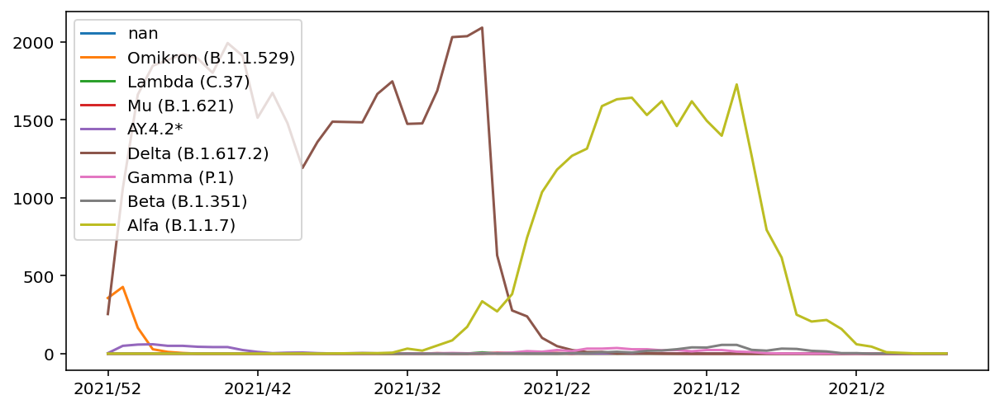

In [35]:
plt.rcdefaults
df_.plot(figsize=(10,4))
plt.legend(bbox_to_anchor=(0, 1), loc='upper left', ncol=1)

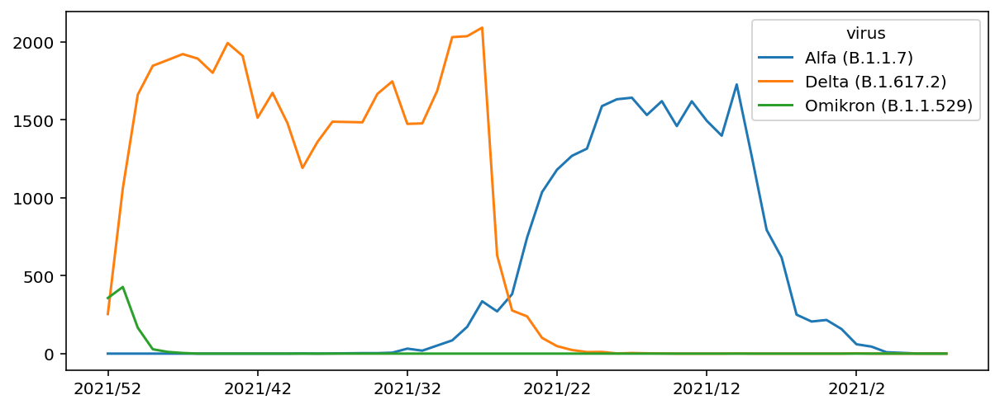

In [36]:
df_[['Alfa (B.1.1.7)', 'Delta (B.1.617.2)', 'Omikron (B.1.1.529)']].plot(figsize=(10,4));

In [39]:
# df_.loc[['Alfa (B.1.1.7)', 'Delta (B.1.617.2)', 'Omikron (B.1.1.529)']].plot()

<AxesSubplot:>

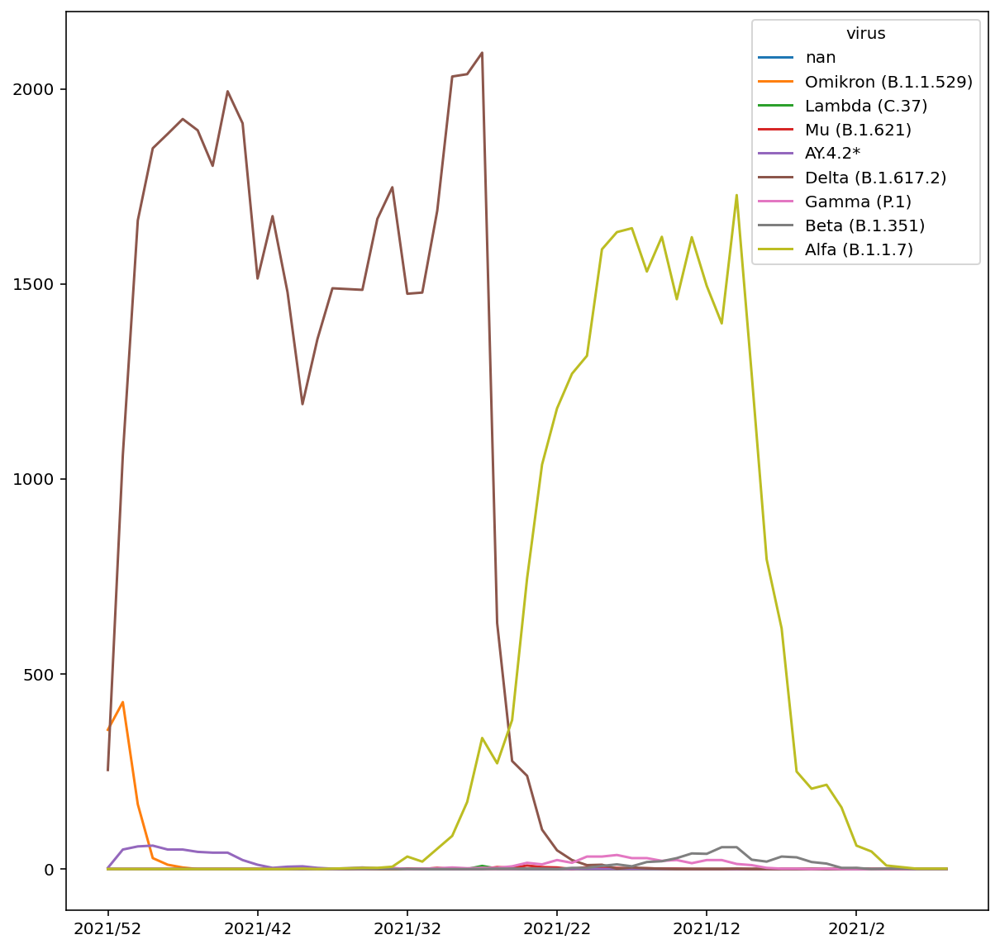

In [38]:
df_.plot(figsize=(10,10))

In [40]:
df_.T

,2021/52,2021/51,2021/50,2021/49,2021/48,2021/47,2021/46,2021/45,2021/44,2021/43,...,2021/5,2021/4,2021/3,2021/2,2021/1,2020/53,2020/52,2020/51,2020/50,2020/49
virus,,,,,,,,,,,,,,,,,,,,,
NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Omikron (B.1.1.529),357.0,428.0,166.0,28.0,11.0,4.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Lambda (C.37),0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Mu (B.1.621),0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AY.4.2*,3.0,50.0,58.0,60.0,50.0,50.0,44.0,42.0,42.0,23.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Delta (B.1.617.2),254.0,1061.0,1663.0,1848.0,1885.0,1923.0,1894.0,1803.0,1994.0,1912.0,...,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0
Gamma (P.1),0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Beta (B.1.351),0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,18.0,14.0,3.0,3.0,0.0,1.0,1.0,0.0,0.0,0.0
Alfa (B.1.1.7),0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,206.0,216.0,158.0,60.0,45.0,9.0,5.0,1.0,1.0,1.0


In [41]:
# !ls CookBooks/Sources
dfe = pd.read_excel('CookBooks/Sources/ExpectedDeathsCoViD.xlsx')

dfe.head()

,year,week,Deceased,Expected,ExpectedLow95,ExpectedHigh95
0,2020,1.0,3103.0,3277.0,2908.0,3645.0
1,2020,2.0,3364.0,3311.0,2930.0,3692.0
2,2020,3.0,3157.0,3344.0,2945.0,3742.0
3,2020,4.0,3046.0,3392.0,3008.0,3776.0
4,2020,5.0,3164.0,3407.0,3027.0,3788.0


In [42]:
dfe['week'] = dfe['week'].astype('Int64').astype(str)

In [43]:
dfe['Weeknummer'] = dfe['year']+'/'+(dfe['week'])

In [44]:
dfe = dfe.set_index('Weeknummer')

In [45]:
dfe.head()

,year,week,Deceased,Expected,ExpectedLow95,ExpectedHigh95
Weeknummer,,,,,,
2020/1,2020,1,3103.0,3277.0,2908.0,3645.0
2020/2,2020,2,3364.0,3311.0,2930.0,3692.0
2020/3,2020,3,3157.0,3344.0,2945.0,3742.0
2020/4,2020,4,3046.0,3392.0,3008.0,3776.0
2020/5,2020,5,3164.0,3407.0,3027.0,3788.0


In [46]:
dfe = dfe[:-1]

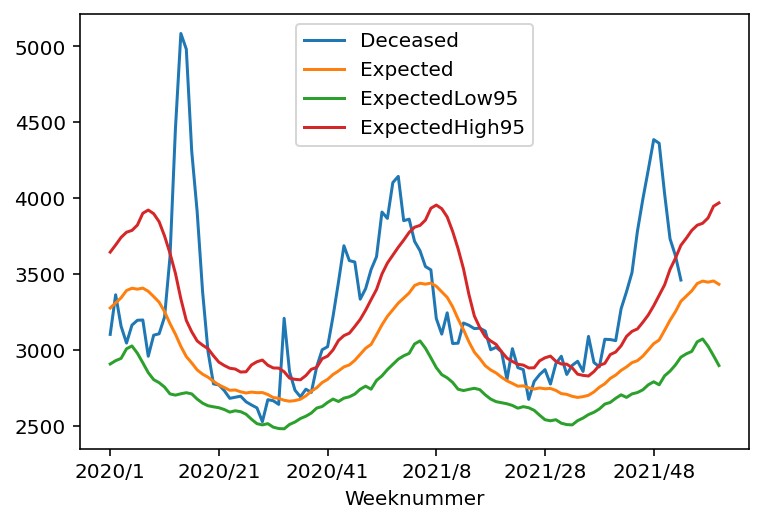

In [47]:
dfe[['Deceased','Expected','ExpectedLow95','ExpectedHigh95']].plot();

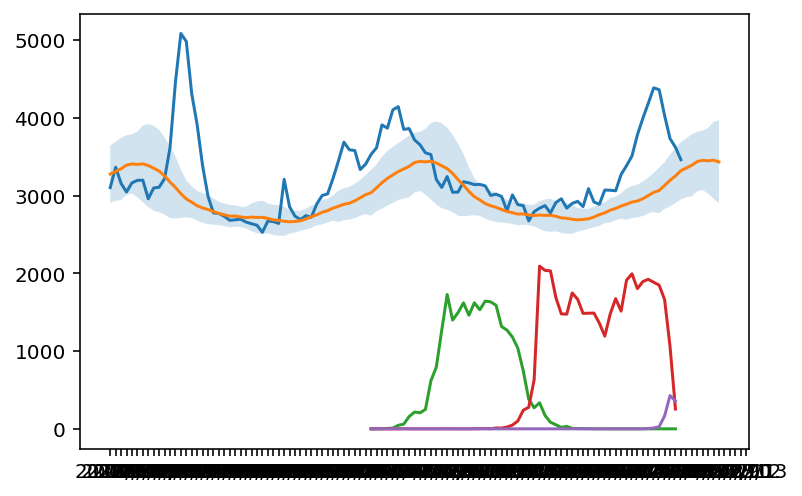

In [48]:
fig, ax = plt.subplots()
ax.plot(dfe.index, dfe[['Deceased','Expected']])#,'ExpectedLow95','ExpectedHigh95']], '-')
ax.fill_between(dfe.index, dfe['ExpectedLow95'], dfe['ExpectedHigh95'], alpha=0.2)
ax.plot(df_.index, df_[['Alfa (B.1.1.7)', 'Delta (B.1.617.2)', 'Omikron (B.1.1.529)']])

In [49]:
dfe.index

Index(['2020/1', '2020/2', '2020/3', '2020/4', '2020/5', '2020/6', '2020/7',
       '2020/8', '2020/9', '2020/10',
       ...
       '2022/43', '2022/44', '2022/45', '2022/46', '2022/47', '2022/48',
       '2022/49', '2022/50', '2022/51', '2022/52'],
      dtype='object', name='Weeknummer', length=157)

In [55]:
groupedDate['temp'] = groupedDate.index

In [56]:
groupedDate.head()

,Total_reported,Hospital_admission,Deceased,temp
Date_of_publication,,,,
2020-02-28,1,1,0,2020-02-28
2020-02-29,1,0,0,2020-02-29
2020-03-01,3,1,0,2020-03-01
2020-03-02,5,0,0,2020-03-02
2020-03-03,4,1,0,2020-03-03


In [57]:
from datetime import datetime
groupedDate['temp'] = groupedDate['temp'].str.replace('-', '/')

# groupedDate['temp_t'] = datetime.strptime(groupedDate['temp'], '%y-%m-%d')

In [60]:
groupedDate['temp_t']=pd.to_datetime(groupedDate['temp'], format='%Y/%M/%d')


In [62]:
groupedDate.head()

,Total_reported,Hospital_admission,Deceased,temp,temp_t
Date_of_publication,,,,,
2020-02-28,1,1,0,2020/02/28,2020-01-28 00:02:00
2020-02-29,1,0,0,2020/02/29,2020-01-29 00:02:00
2020-03-01,3,1,0,2020/03/01,2020-01-01 00:03:00
2020-03-02,5,0,0,2020/03/02,2020-01-02 00:03:00
2020-03-03,4,1,0,2020/03/03,2020-01-03 00:03:00


In [64]:
groupedDate.dtypes

Total_reported                 int64
Hospital_admission             int64
Deceased                       int64
temp                          object
temp_t                datetime64[ns]
dtype: object

In [69]:
df_.index.inferred_type

'string'

In [71]:
dfe.head()

,year,week,Deceased,Expected,ExpectedLow95,ExpectedHigh95
Weeknummer,,,,,,
2020/1,2020,1,3103.0,3277.0,2908.0,3645.0
2020/2,2020,2,3364.0,3311.0,2930.0,3692.0
2020/3,2020,3,3157.0,3344.0,2945.0,3742.0
2020/4,2020,4,3046.0,3392.0,3008.0,3776.0
2020/5,2020,5,3164.0,3407.0,3027.0,3788.0


In [72]:
import datetime

def weeknum_to_dates(weeknum):
    return [datetime.datetime.strptime({dfe['year']+ str(weeknum) + str(x), "%Y-W%W-%w").strftime('%d.%m.%Y') 
            for x in range(-5,0)]

weeknum_to_dates(37)

['17.09.2021', '16.09.2021', '15.09.2021', '14.09.2021', '13.09.2021']

In [86]:
import datetime
# d = dfe['year'][3] + '-' + dfe['week'][3]
def wk2date(yr, wk):
    r = datetime.datetime.strptime(yr +'-'+wk + '-1', "%Y-%W-%w")
    return r
dfe['Q'] = dfe.apply(lambda dfe:wk2date(dfe['year'],dfe['week']), axis=1)
dfe.head()

,year,week,Deceased,Expected,ExpectedLow95,ExpectedHigh95,Q
Weeknummer,,,,,,,
2020/1,2020,1,3103.0,3277.0,2908.0,3645.0,2020-01-06
2020/2,2020,2,3364.0,3311.0,2930.0,3692.0,2020-01-13
2020/3,2020,3,3157.0,3344.0,2945.0,3742.0,2020-01-20
2020/4,2020,4,3046.0,3392.0,3008.0,3776.0,2020-01-27
2020/5,2020,5,3164.0,3407.0,3027.0,3788.0,2020-02-03


In [85]:
wk2date(dfe['year'],dfe['week'])

datetime.datetime(2020, 1, 27, 0, 0)

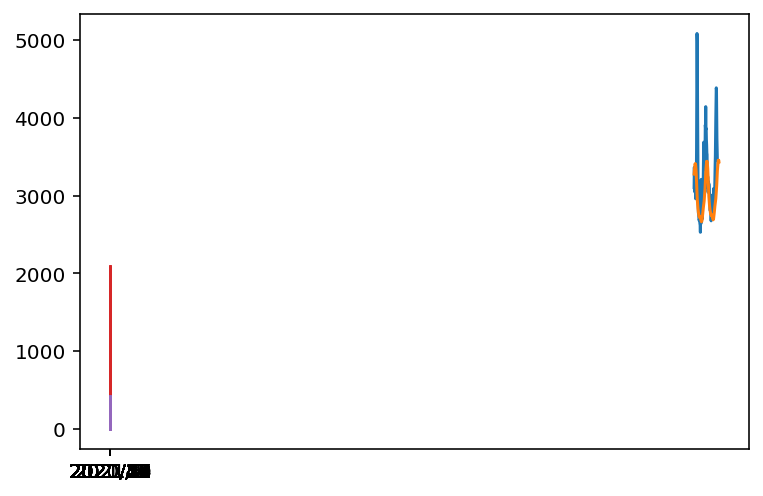

In [89]:
fig, ax = plt.subplots()
ax.plot(dfe.Q, dfe[['Deceased','Expected']])#,'ExpectedLow95','ExpectedHigh95']], '-')
ax.fill_between(dfe.Q, dfe['ExpectedLow95'], dfe['ExpectedHigh95'], alpha=0.2)
ax.plot(df_.index, df_[['Alfa (B.1.1.7)', 'Delta (B.1.617.2)', 'Omikron (B.1.1.529)']])

In [90]:
df_.index

Index(['2021/52', '2021/51', '2021/50', '2021/49', '2021/48', '2021/47',
       '2021/46', '2021/45', '2021/44', '2021/43', '2021/42', '2021/41',
       '2021/40', '2021/39', '2021/38', '2021/37', '2021/36', '2021/35',
       '2021/34', '2021/33', '2021/32', '2021/31', '2021/30', '2021/29',
       '2021/28', '2021/27', '2021/26', '2021/25', '2021/24', '2021/23',
       '2021/22', '2021/21', '2021/20', '2021/19', '2021/18', '2021/17',
       '2021/16', '2021/15', '2021/14', '2021/13', '2021/12', '2021/11',
       '2021/10', '2021/9', '2021/8', '2021/7', '2021/6', '2021/5', '2021/4',
       '2021/3', '2021/2', '2021/1', '2020/53', '2020/52', '2020/51',
       '2020/50', '2020/49'],
      dtype='object')

In [92]:
df_['temp'] = df_.index.copy()

In [96]:
df_['year'] =  [x[:4] for x in df_['temp']]

In [100]:
df_['week'] =  [x[-2:] for x in df_['temp']]

In [106]:
df_['week'] = df_['week'].str.replace('/', '')


In [107]:
import datetime
# d = dfe['year'][3] + '-' + dfe['week'][3]
def wk2date(yr, wk):
    r = datetime.datetime.strptime(yr +'-'+ wk + '-1', "%Y-%W-%w")
    return r
df_['Q'] = df_.apply(lambda df_:wk2date(df_['year'],df_['week']), axis=1)
df_.head()

virus,NaN,Omikron (B.1.1.529),Lambda (C.37),Mu (B.1.621),AY.4.2*,Delta (B.1.617.2),Gamma (P.1),Beta (B.1.351),Alfa (B.1.1.7),temp,year,week,Q
2021/52,NaN,357.0,0.0,0.0,3.0,254.0,0.0,0.0,0.0,2021/52,2021,52,2021-12-27
2021/51,NaN,428.0,0.0,0.0,50.0,1061.0,0.0,0.0,0.0,2021/51,2021,51,2021-12-20
2021/50,NaN,166.0,0.0,0.0,58.0,1663.0,0.0,0.0,0.0,2021/50,2021,50,2021-12-13
2021/49,NaN,28.0,0.0,0.0,60.0,1848.0,0.0,0.0,0.0,2021/49,2021,49,2021-12-06
2021/48,NaN,11.0,0.0,0.0,50.0,1885.0,0.0,0.0,0.0,2021/48,2021,48,2021-11-29


No handles with labels found to put in legend.


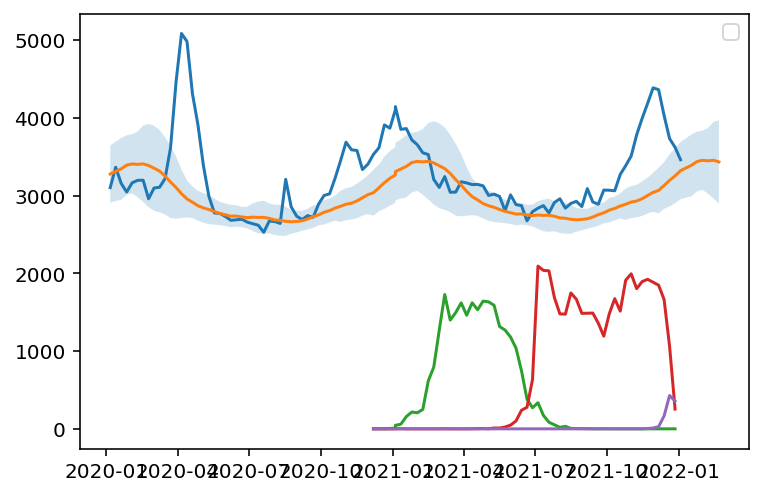

In [109]:
fig, ax = plt.subplots()
ax.plot(dfe.Q, dfe[['Deceased','Expected']])#,'ExpectedLow95','ExpectedHigh95']], '-')
ax.fill_between(dfe.Q, dfe['ExpectedLow95'], dfe['ExpectedHigh95'], alpha=0.2)
ax.plot(df_.Q, df_[['Alfa (B.1.1.7)', 'Delta (B.1.617.2)', 'Omikron (B.1.1.529)']])

In [119]:
df_.head()

virus,NaN,Omikron (B.1.1.529),Lambda (C.37),Mu (B.1.621),AY.4.2*,Delta (B.1.617.2),Gamma (P.1),Beta (B.1.351),Alfa (B.1.1.7),temp,year,week,Q
2021/52,NaN,357.0,0.0,0.0,3.0,254.0,0.0,0.0,0.0,2021/52,2021,52,2021-12-27
2021/51,NaN,428.0,0.0,0.0,50.0,1061.0,0.0,0.0,0.0,2021/51,2021,51,2021-12-20
2021/50,NaN,166.0,0.0,0.0,58.0,1663.0,0.0,0.0,0.0,2021/50,2021,50,2021-12-13
2021/49,NaN,28.0,0.0,0.0,60.0,1848.0,0.0,0.0,0.0,2021/49,2021,49,2021-12-06
2021/48,NaN,11.0,0.0,0.0,50.0,1885.0,0.0,0.0,0.0,2021/48,2021,48,2021-11-29


In [129]:
df_.drop('temp', axis=1, inplace=True)

In [124]:
df_.dropna(axis=1, how='all', inplace = True)

In [125]:
df_.head()

virus,Omikron (B.1.1.529),Lambda (C.37),Mu (B.1.621),AY.4.2*,Delta (B.1.617.2),Gamma (P.1),Beta (B.1.351),Alfa (B.1.1.7),temp,year,week,Q
2021/52,357.0,0.0,0.0,3.0,254.0,0.0,0.0,0.0,2021/52,2021,52,2021-12-27
2021/51,428.0,0.0,0.0,50.0,1061.0,0.0,0.0,0.0,2021/51,2021,51,2021-12-20
2021/50,166.0,0.0,0.0,58.0,1663.0,0.0,0.0,0.0,2021/50,2021,50,2021-12-13
2021/49,28.0,0.0,0.0,60.0,1848.0,0.0,0.0,0.0,2021/49,2021,49,2021-12-06
2021/48,11.0,0.0,0.0,50.0,1885.0,0.0,0.0,0.0,2021/48,2021,48,2021-11-29


In [131]:
num_cols = df_.columns[df_.dtypes.apply(lambda c: np.issubdtype(c, np.number))]

<AxesSubplot:>

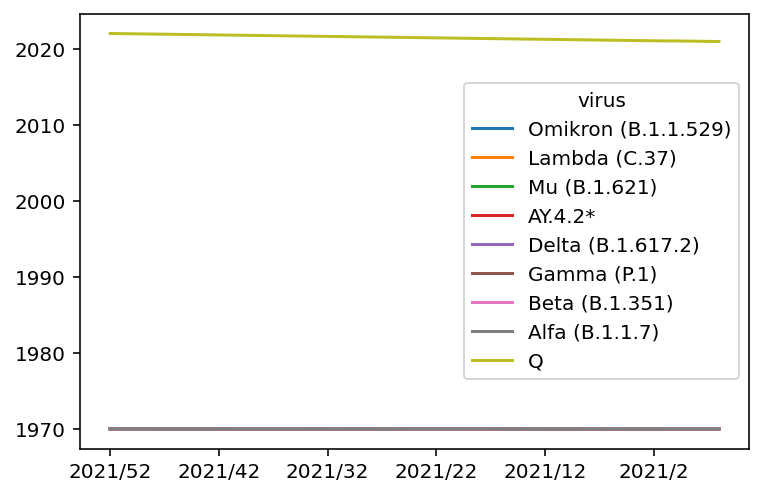

In [139]:
scaler = StandardScaler()

df_[num_cols] = scaler.fit_transform(df_[num_cols])

df_.plot()

In [130]:
from sklearn.preprocessing import StandardScaler 
import pandas as pd

std_scaler = StandardScaler()
 
df__scaled = std_scaler.fit_transform(df_.to_numpy())
df__scaled = pd.DataFrame(df__scaled)

TypeError: float() argument must be a string or a number, not 'Timestamp'

In [140]:
num_cols_e = dfe.columns[dfe.dtypes.apply(lambda c: np.issubdtype(c, np.number))]

In [141]:
num_cols_e

Index(['Deceased', 'Expected', 'ExpectedLow95', 'ExpectedHigh95'], dtype='object')

In [143]:
scaler = StandardScaler()

dfe[num_cols_e] = scaler.fit_transform(dfe[num_cols_e])

In [145]:
dfe

,year,week,Deceased,Expected,ExpectedLow95,ExpectedHigh95,Q
Weeknummer,,,,,,,
2020/1,2020,1,-0.287792,1.035669,1.131257,0.965970,2020-01-06
2020/2,2020,2,0.216104,1.162189,1.269692,1.086740,2020-01-13
2020/3,2020,3,-0.183538,1.284987,1.364080,1.215217,2020-01-20
2020/4,2020,4,-0.397838,1.463603,1.760507,1.302582,2020-01-27
2020/5,2020,5,-0.170023,1.519421,1.880065,1.333417,2020-02-03
...,...,...,...,...,...,...,...
2022/48,2022,48,NaN,NaN,NaN,NaN,2022-11-28
2022/49,2022,49,NaN,NaN,NaN,NaN,2022-12-05
2022/50,2022,50,NaN,NaN,NaN,NaN,2022-12-12


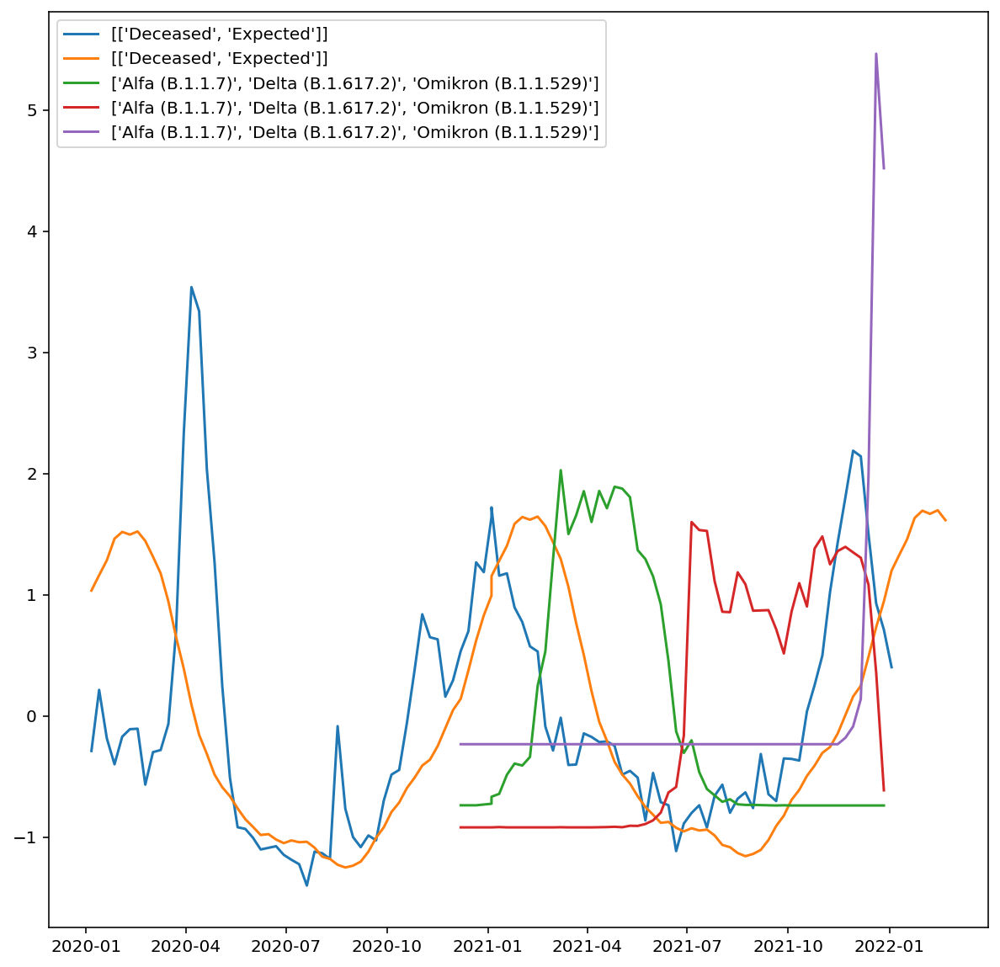

In [158]:
# import matplotlib.dates as mdates
# df_.Q = mdates.epoch2num(df_.Q)
fig, ax = plt.subplots(figsize=(10,10))
ax.plot(dfe.Q, dfe[['Deceased','Expected']], label = [['Deceased','Expected']])#,'ExpectedLow95','ExpectedHigh95']], '-')
# ax.fill_between(dfe.Q, dfe['ExpectedLow95'], dfe['ExpectedHigh95'], alpha=0.2,
#                label = 'expected')
# ax.plot(dfe.Q, dfe['ExpectedLow95'], dfe['ExpectedHigh95'], alpha=0.2)
#                label = 'expected')
ax.plot(df_.Q, df_[['Alfa (B.1.1.7)', 'Delta (B.1.617.2)', 'Omikron (B.1.1.529)']],
       label=['Alfa (B.1.1.7)', 'Delta (B.1.617.2)', 'Omikron (B.1.1.529)'] )
ax.legend()

In [68]:
directory = '/Users/maartenk/Documents/git/CookBooks/Sources/'
dataframe = 'map_df_combined'
file = f'{dataframe}_BE'
fp = directory+file
temp = pd.read_pickle(fp)



In [69]:
temp.head()

,key_0,key_0_x,tgid,modifdate,arrondissementcapital,provincecapital,regioncapital,countrycapital,niscode,city,...,nameger,namefre,namedut,geometry,CASES,key_0_y,MS_POPULATION,TX_DESCR_NL,CovDens,CovDensPm
0,11001,11001,{F08D52FC-A4B7-4D74-94CF-2F9784E609DD},2007-01-05T00:00:00+01:00,False,False,False,False,11001,2,...,Aartselaar,Aartselaar,Aartselaar,"MULTIPOLYGON (((650219.173 700596.060, 650220....",4178,11001,14455,Aartselaar,0.289035,289034.936008
1,11002,11002,{2CC53084-53C6-4B68-8775-25075F330E76},2007-01-05T00:00:00+01:00,True,True,False,False,11002,1,...,Antwerpen,Anvers,Antwerpen,"MULTIPOLYGON (((650423.422 703934.632, 650416....",149742,11002,529417,Antwerpen,0.282843,282843.202995
2,11004,11004,{B9D2FDD5-BE2F-4F24-B638-64EEAAF8C530},2007-01-05T00:00:00+01:00,False,False,False,False,11004,2,...,Boechout,Boechout,Boechout,"MULTIPOLYGON (((660706.459 704172.728, 660696....",3722,11004,13527,Boechout,0.275153,275153.396910
3,11005,11005,{3F6DC08D-3058-4B15-8D48-51854B266122},2007-01-05T00:00:00+01:00,False,False,False,False,11005,2,...,Boom,Boom,Boom,"MULTIPOLYGON (((651769.785 697734.315, 651769....",5562,11005,18799,Boom,0.295867,295866.801426
4,11007,11007,{05435A1C-7965-4766-BBFA-2FBF3EB0B527},2007-01-05T00:00:00+01:00,False,False,False,False,11007,2,...,Borsbeek,Borsbeek,Borsbeek,"MULTIPOLYGON (((659334.097 709025.347, 659319....",3210,11007,11077,Borsbeek,0.289790,289789.654239


NameError: name 'df' is not defined

AttributeError: module 'cartopy.crs' has no attribute 'feature'

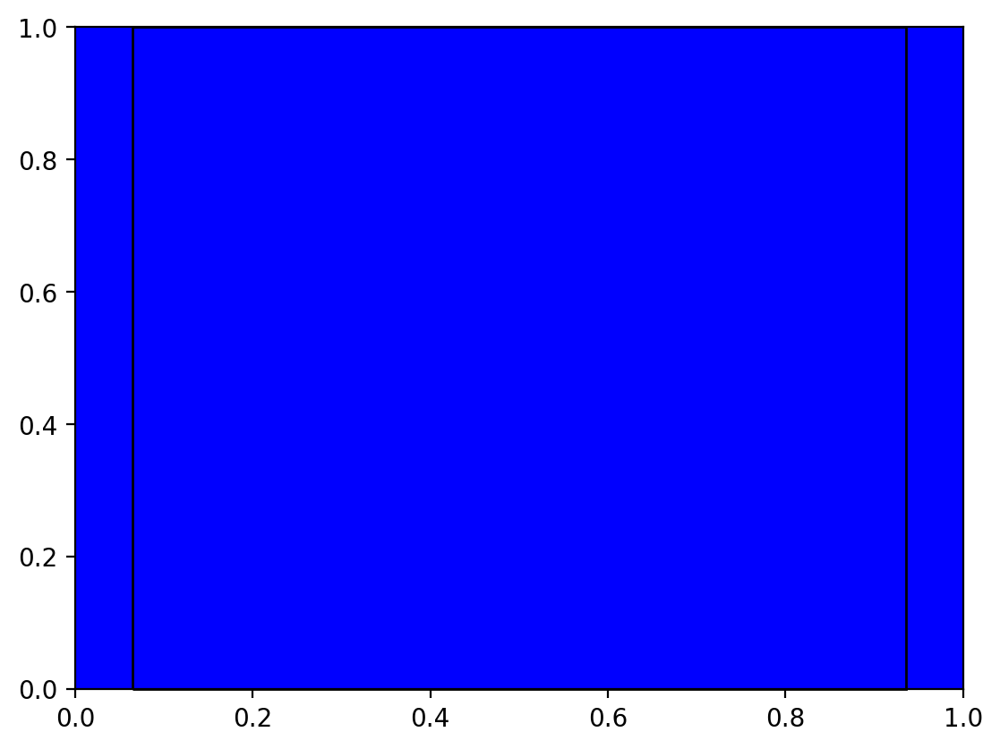

In [89]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs

fig = plt.figure()
ax1 = fig.add_subplot(111, fc='b')
ax2 = fig.add_subplot(111, fc='None', projection=ccrs.Mercator())
ax2.background_patch.set_fill(False)
ax2.add_feature(ccrs.feature.LAND)
ax2.coastlines(color='red', linewidth=0.75)
plt.show()